# Домашнее задание №1

В этом домашнем задании вам предлагается обучить модель регрессии для предсказания стоимости автомобилей, а также реализовать веб-сервис для применения построенной модели на новых данных.

> Оценка за домашку = min(ваш балл, 10)


Задания, <font color='#9933CC'>выделенные фиолетовым</font>, требуют от вас написания кода.

А вопросы, <font color='#FF6600'>выделенные оранжевым</font>, текстового ответа.

Оцениваются как код, так и ответы на вопросы. Если нет одного и/или другого, то часть баллов за соответствующее задание без колебаний снимается.

In [390]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
import re

from IPython.display import display

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams['figure.figsize'] = 12, 8
plt.rcParams['font.size'] = 12
sns.set_style('darkgrid')

random.seed(42)
np.random.seed(42)

Ниже ответьте на вопрос <font color='#FF6600'>
"Для чего фиксируем сиды в домашках?"</font>
> **Ответ:** Сиды фиксируем для репрезентативности экспериментов: если сиды зафиксированы, то весь рандом так же фиксирован, и при повторном запуске функций, которые зависят от рандома результат их работы не должен измениться.

In [391]:
# понадобится для финальной выгрузки модели
final_dict = {}

# Часть 1 (2.5 балла + 0.75) | EDA

## Простейший EDA и обработка признаков (1.5 балла + 0.25)

In [392]:
df_train = pd.read_csv('https://raw.githubusercontent.com/hse-mlds/ml/main/hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/hse-mlds/ml/main/hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


(0.15 балла) <font color='#9933CC'>Отобразите 10 **случайных** строк тренировочного датасета</font>

In [393]:
df_train.sample(10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6565,Renault KWID Climber 1.0 MT BSIV,2019,300000,35000,Petrol,Individual,Manual,First Owner,23.01 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0
2943,Maruti Wagon R LXI,2013,225000,58343,Petrol,Trustmark Dealer,Manual,First Owner,21.79 kmpl,998 CC,67.05 bhp,90Nm@ 3500rpm,5.0
2024,Hyundai i20 Asta 1.2,2013,360000,30000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
263,Hyundai i20 1.2 Asta,2010,300000,70000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1197 CC,80 bhp,"11.4 kgm at 4,000 rpm",5.0
4586,Skoda Octavia L and K 1.9 TDI MT,2005,250000,120000,Diesel,Individual,Manual,Third Owner,16.4 kmpl,1896 CC,90 bhp,"21.4@ 1,900(kgm@ rpm)",5.0
4479,Maruti Ciaz ZXi,2016,700000,20000,Petrol,Individual,Manual,First Owner,20.73 kmpl,1373 CC,91.1 bhp,130Nm@ 4000rpm,5.0
4881,Hyundai Grand i10 1.2 Kappa Magna BSIV,2017,445000,27000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
3583,Ford Ecosport 1.5 DV5 MT Trend,2016,515000,68609,Diesel,Dealer,Manual,First Owner,22.7 kmpl,1498 CC,89.84 bhp,204Nm@ 2000-2750rpm,5.0
6361,Hyundai Verna 1.4 VTVT,2014,500000,33400,Petrol,Individual,Manual,First Owner,17.43 kmpl,1396 CC,105.5 bhp,135.3Nm@ 5000rpm,5.0
4108,Hyundai i20 Era 1.2,2015,490000,45900,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0


(0.1 балла) <font color='#9933CC'>Отобразите первые 5 и последние 5 объектов тестового датасета</font>

In [394]:
display(df_train.head())
display(df_train.tail())

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6994,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
6995,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0
6996,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3 kmpl,1248 CC,73.9 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0
6998,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


(0.1 балла) <font color='#9933CC'>Посчитайте основные статистики как по числовым, так и по категориальным столбцам для трейна и теста</font>.
> Подсказка: ``.describe()`` с нужным(и) аргументом(-ами)



In [395]:
display(df_train.describe(include=np.number))
display(df_train.describe(include=object))

,year,selling_price,km_driven,seats
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008
std,4.053095,8.089419e+05,5.772400e+04,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803,6796
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330,468


(0.15 балла) <font color='#9933CC'>Посмотрите, есть ли в датасете пропуски.</font>

<font color='#FF6600'>Если есть, то в каких колонках?</font>

In [396]:
# df_train[]
missings = df_train.isna().any()

print("Пропуски есть в столбцах:", ", ".join(missings[lambda x: x].index))

Пропуски есть в столбцах: mileage, engine, max_power, torque, seats


(0.1 балла) <font color='#9933CC'>Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием</font> (целевую переменную следует исключить). Если есть, то сколько?

In [397]:
X_train = df_train.drop(columns="selling_price")
duplicates = X_train[X_train.duplicated()]
print("Повторяющихся объектов", len(duplicates))

Повторяющихся объектов 1159


(0.15 балла) <font color='#9933CC'>Отобразите такие объекты</font>

In [398]:
duplicates

,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,35000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,82 bhp,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
268,Maruti Swift Dzire VXI,2014,70000,Petrol,Individual,Manual,Second Owner,19.1 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,9000,Diesel,Dealer,Automatic,First Owner,13.6 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56 bhp,202Nm@ 3600-5200rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,60000,Petrol,Individual,Manual,Second Owner,18.0 kmpl,995 CC,62 bhp,90.3Nm@ 4200rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


(0.15 балла) <font color='#9933CC'>Удалите повторяющиеся строки</font>. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю

In [399]:
df_train = df_train.drop_duplicates(duplicates.columns)

In [400]:
assert df_train.shape == (5840, 13)

(0.1 балла) Чтоб все было по красоте, <font color='#9933CC'>обновите индексы строк таким образом, чтобы они шли от 0 без пропусков</font>

In [401]:
df_train = df_train.reset_index(drop=True)
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92 kmpl,1086 CC,62.1 bhp,96.1Nm@ 3000rpm,5.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm,5.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0


Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не слава богу. Давайте починим.

(0.25 балла) Задача такая:
<font color='#9933CC'>
* убрать единицы измерения для признаков ``mileage, engine, max_power``.
* кастануть эти столбцы столбцы к ``float``.
* удалить столбец ``torque``
</font>

> Все действия нужно производить над обоими датасетами

---
**Доп (0.25 балла):**
* <font color='#9933CC'>Вместо удаления признак `torque` разделите на два: собственно `torque` и `max_torque_rpm`.</font> Учтите единицы измерения. Они разные ☹

In [402]:
pattern = r"[^\d+.\d*]"

def fix_features(data):
  data = data.copy()
  data["mileage"] = data["mileage"].str.replace(pattern, "", regex=True).astype(np.float64)
  data["engine"] = data["engine"].str.replace(pattern, "", regex=True).astype(np.float64)
  data["max_power"] = data["max_power"].str.replace(pattern, "", regex=True)
  lengths = data["max_power"].str.len()
  critical_idx = lengths[lengths == 0].index
  data.loc[critical_idx, "max_power"] = np.nan
  data["max_power"] = data["max_power"].astype(np.float64)
  return data

df_train = fix_features(df_train)
df_test = fix_features(df_test)

In [403]:
Nm_const = 9.80665

def split_torque(data):
  torque = data.copy()
  data = data.str.replace("[^0-9-. ]", "", regex=True)
  data = data.str.extract(r"(\d+[.|,]?\d*)\s+(\d+-?\d+)")
  data[1] = data[1].str.replace(r"\d+-", "", regex=True)
  data = data.astype(np.float64)
  data["measure"] = torque.str.lower().str.extract(r"(kgm|nm)")
  data.loc[data["measure"] == "kgm", 0] *= Nm_const
  return data

split_torque(df_train["torque"])

,0,1,measure
0,190.000000,2000.0,nm
1,250.000000,2500.0,nm
2,219.668960,2750.0,kgm
3,112.776475,4500.0,kgm
4,113.750000,4000.0,nm
...,...,...,...
5835,96.100000,3000.0,nm
5836,90.000000,3500.0,nm
5837,113.700000,4000.0,nm
5838,235.359600,2750.0,kgm


In [404]:
df_train_split_torque = split_torque(df_train["torque"])
df_train["torque"] = df_train_split_torque[0]
df_train["max_torque_rpm"] = df_train_split_torque[1]

df_test_split_torque = split_torque(df_test["torque"])
df_test["torque"] = df_test_split_torque[0]
df_test["max_torque_rpm"] = df_test_split_torque[1]

In [405]:
df_train.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190.000000,5.0,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250.000000,5.0,2500.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,219.668960,5.0,2750.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,112.776475,5.0,4500.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,113.750000,5.0,4000.0


(0.15 балла) <font color='#9933CC'>Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось</font>

> Обратите внимание, что, по уму, нужно посчитать медиану по трейну и этим средним заполнять пропуски в тесте. Так же делаем, если, например, стандартизируем признаки.



In [406]:
missings = df_train.isna().any()
missings = missings[lambda x: x]
medians = {}

for col in missings.index:
  median = df_train[col].median()
  medians.update({col: median})
  df_train[col] = df_train[col].fillna(median)
  df_test[col] = df_test[col].fillna(median)

final_dict["medians"] = medians


(0.1 балла) Теперь, когда не осталось пропусков, можно <font color='#9933CC'>преобразовать столбцы к более подходящим типам (``engnine`` и ``seats`` к int)
</font>

Ниже ответьте, <font color='#FF6600'>почему (хоть мы этого и не делаем) ``seats``, возможно, лучше сделать переменной категориальной, а не целочисленной.</font>

In [407]:
print("seats принимает", len(df_train["seats"].unique()), "различных значений")

seats принимает 9 различных значений


> **Ответ:** seats может принимать ограниченное число значений. Кроме того конкретное значение переменной seats описывает категорию модели автомобиля, а не какие-то его характеристики (двуместный или трёхместный автомобиль). На самом деле решение сделать seats категориальной переменной гораздо естественнее, чем не делать этого.

In [408]:
df_train[["seats", "engine", "max_torque_rpm"]] = df_train[["seats", "engine", "max_torque_rpm"]].astype(int)
df_test[["seats", "engine", "max_torque_rpm"]] = df_test[["seats", "engine", "max_torque_rpm"]].astype(int)

In [409]:
df_train.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190.000000,5,2000
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250.000000,5,2500
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,219.668960,5,2750
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,112.776475,5,4500
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,113.750000,5,4000


## Визуализации (1 балл + 0.5)

Визуализировать нам надо не так уж и много. Во-первых, хотелось бы, в принципе, увидеть как распределены значения признаков. Также хотелось бы понять, насколько признаки скоррелированы между собой и с целевой переменной. А ещё неплохо бы посмотреть, не оказалось ли так, что тестовые данные распределены иначе, чем трейн.

Этим всем и предлагаем вам заняться.

(0.25 балла) <font color='#9933CC'>Посторойте попарные распределения всех числовых признаков для трейна.</font>

> ``sns.paiplot()`` позволяет сделать это в одну строчку

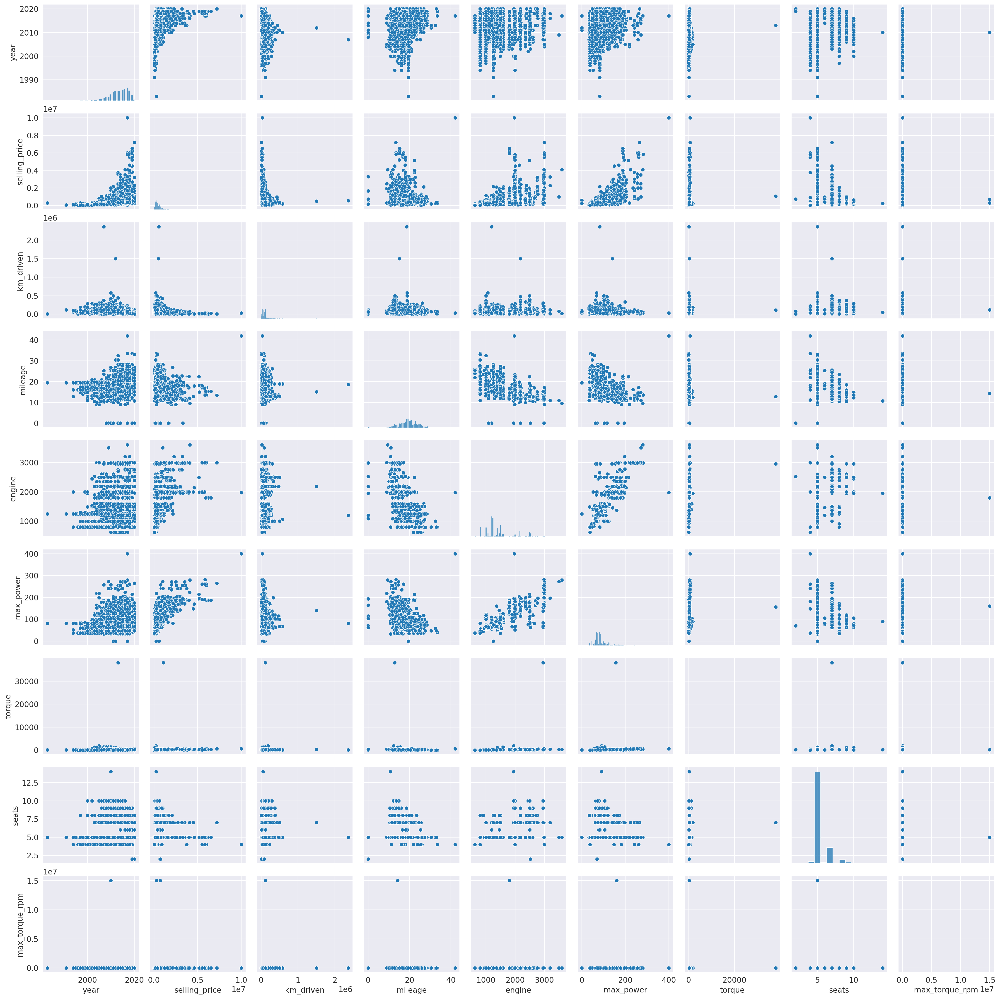

In [410]:
sns.pairplot(df_train)

Этот график не такой информативный, как можно было бы построить, беря признаки по отдельности. Но он позволяет сделать некоторые (возможно, далеко идущие) выводы. Впрочем, со многими из них (если не со всеми) вы бы справились умозрительно. Однако всегда приятно делать выводы, основываясь на данных.



* <font color='#FF6600'> Что можно сказать о связи предикторов с целевой переменной?
* А о корреляциях признаков? </font>

> **Ответ:**
1. Посмотрим на график для каждого признака:
  *  Year: видно, что с одной стороны чем новее машина, тем больше цена за неё. Но с другой, это не совсем правда, т.к. некоторые новые машины продаются по примерно той же цене, что старые. Правильнее будет сказать, что чем новее выше год выпуска, тем выше дисперсия цены машины.
  *  km_driven: тут всё логично: чем меньше машина проехала, тем выше она стоит (нет износа деталей и всё такое). Хотя в данных есть выбросы, которые мешают исследовать визуализацию: какие-то два придурка намотали по паре миллионов километров. Я тут загуглил снимки Земли с расстояния в миллион километров, забавно.
  *  mileage: судя по [словарю](https://dictionary.cambridge.org/dictionary/english/mileage), mileage это либо суммарное расстояние, которое проехала машина, либо расстояние, которое она может проехать с конкретным количеством топлива. Судя по тому, что этот признак принимает значения из конкретного диапазона, это всё таки второй вариант. Кроме того, если бы это было суммарное пройденное растояние, тогда мы могли бы наблюдать сильную линейную зависимость признака от km_driven. Относительно связи признака с ценой сложно что-то сказать, т.к. видно, что есть конкретный диапазон значений, внутри которого бывают автомобили с самой разной ценой. А бывают крайне редкие значения, которые нам логичнее интерпретироватб как выбросы.
  *  engine: рабочий объём двигателя. Видно, что чем выше значения, тем выше диперсия цен, при этом максимальная цена зависит примерно экспоненциально от значений признака.
  *  max_power: схожая ситуация с предыдущим признаком, однако здесь верхняя граница на цену зависит линейно от значений признака.
  *  torque: мало что можно сказать про связь: в данных присутствует очевидный выброс, который мешает нормальной визуализации.
  *  seats: видно, что чем больше сидений, тем дешевле автомобиль. Это говорит о том что в данных легковые автомобили с небольшим числом сидений дешевле, чем автобусы.
  *  max_torque_rpm: аналогичная ситуация с torque, про связь с ценой особо ничего не сказать.

> 2. Сложно смотреть сразу на все зависимости, но мне в глаза бросились три наблюдения:
  *  Чем больше год, тем больше дисперсия примерно всех признаков. Это видимо связано с тем, что начали производить больше автомобилей и эксперементировать с характеристиками.
  *  Чем меньше сидений, тем больше значения max_power автомобилей.
  *  max_power зависит от значений признака engine почти линейно.

(0.25 балла) <font color='#9933CC'>Постройте pairplot по тестовым данным</font> и ответьте на вопрос <font color='#FF6600'>"Похожими ли оказались совокупности при разделении на трейн и тест?"</font>

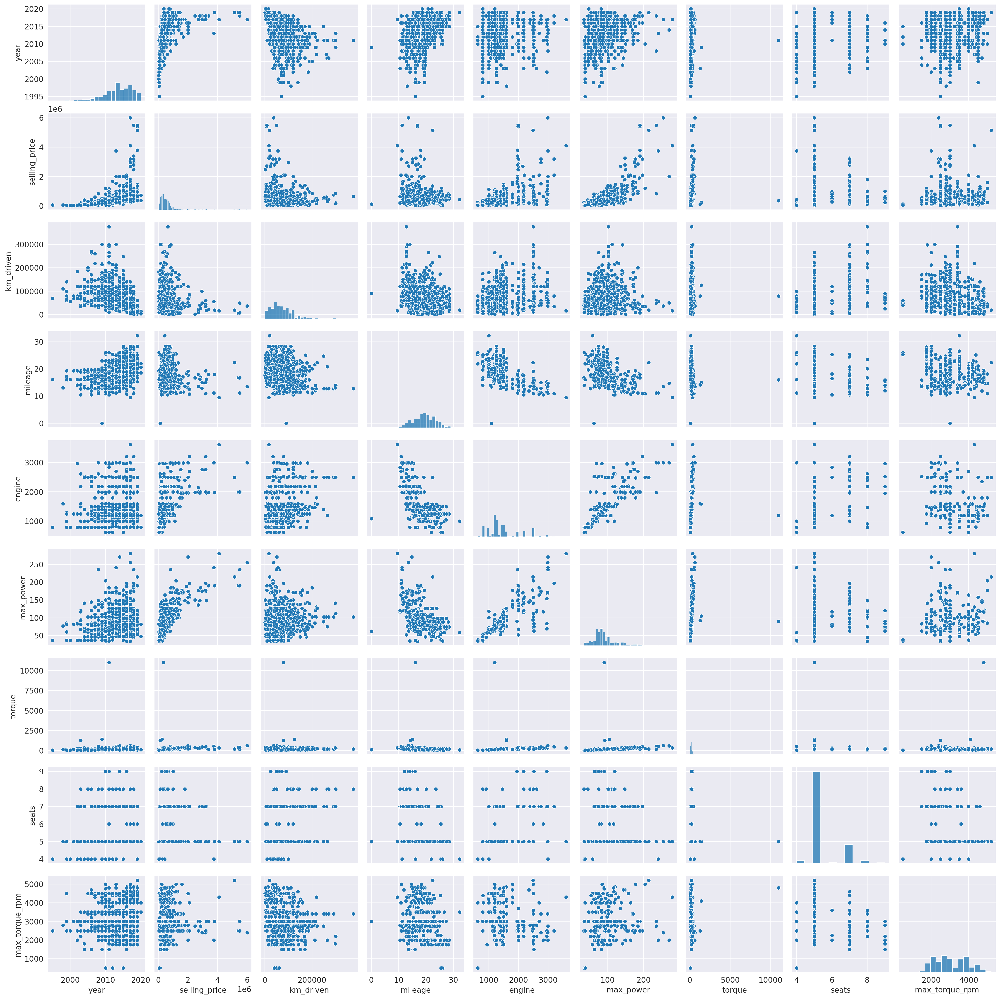

In [411]:
sns.pairplot(df_test)

> **Ответ:** есть некоторые существенные различия:  
1. В тестовой выборке явно больше новых автомобилей, чем старых, из-за этого дисперсия цены в зависимости от года меньше, чем в трейне.
2. В тестовой выборке значительно больше автомобилей, которые проехали какое-то расстояние, тогда как в трейне автомобили были в основном без пробега. Это, в частности, сильно влияет на распределение цен.
3. Цена зависит примерно экспоненциально от обоих признаков max_power и engine.  
Однако, как и в трейн-выборке, значения признака max_power зависят почти линейно от признака engine, а с увеличением количества сидений max_power проседает.

В целом видно, что и в трейне, и в тесте есть объекты-выбросы, и не очень понятно, почему нет задания на очистку выборки от них.

(0.25 балла) <font color='#9933CC'>Для трейна давайте построим тепловую карту (heatmap из библиотеки seaborn) попарных корреляций числовых колонок</font>

<Axes: >

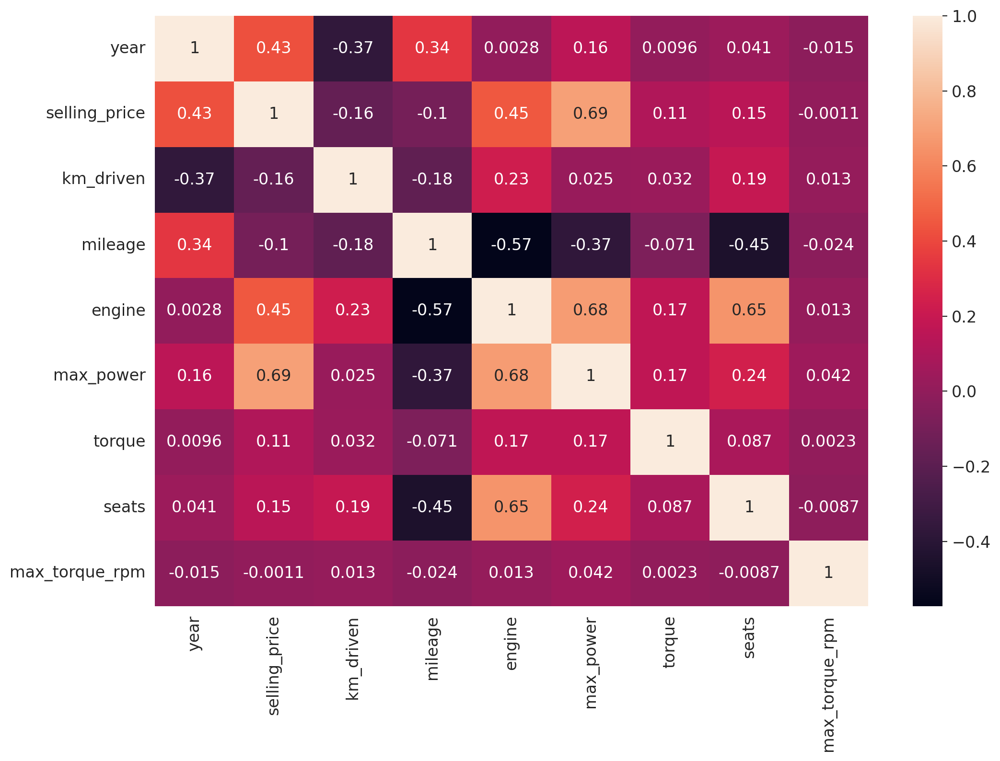

In [412]:
sns.heatmap(df_train.select_dtypes(include='number').corr(), annot=True)

Ответьте, пожалуйста, на вопросы:
* <font color='#FF6600'>Какие 2 признака наименее скоррелированы между собой?</font>
* <font color='#FF6600'>Между какими наблюдается довольно сильная положительная линейная зависимость?</font>
* <font color='#FF6600'>Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи.</font>

> **Ответ:**  
1. Наименее скоррелированы признаки max_torque_rpm и torque: коэффициент корреляции всего $0.002$.
2. Наиболее положительно скоррелированы признаки max_power и engine, как я уже отмечал в прошлом задании.
3. Судя по довольно большому по модулю коэффициенту корреляции $-0.37$ так утверждать вполне уместно.

(0.25 балла) <font color='#9933CC'> Отобразите диаграммe рассеяния для наиболее скореллированной пары **признаков** (на трейне) </font>

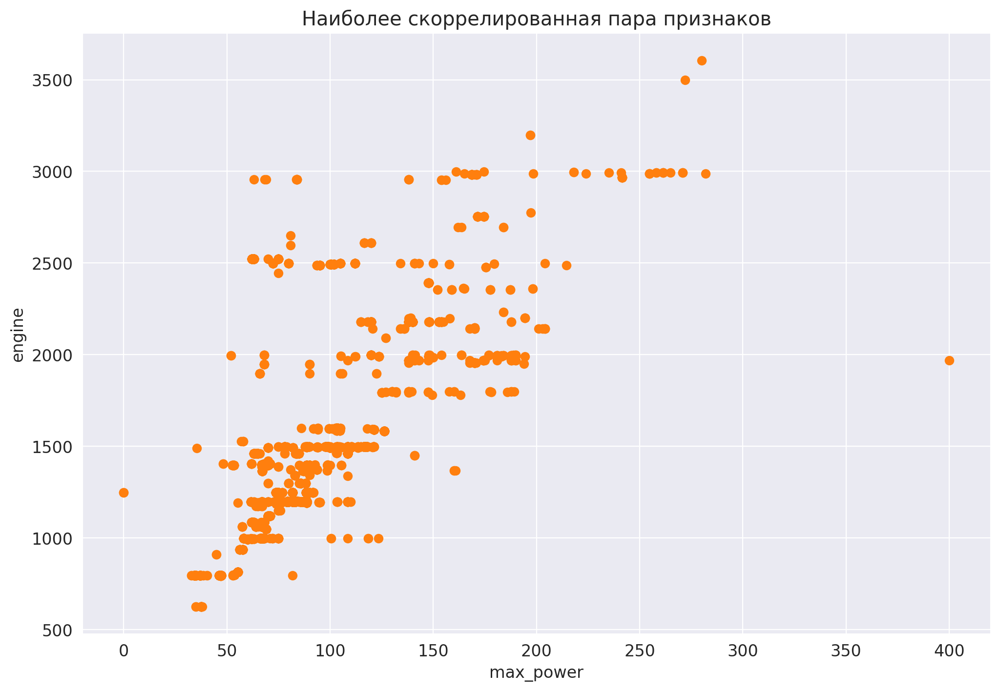

In [413]:
plt.scatter(df_train["max_power"], df_train["engine"], c="C1")
plt.xlabel("max_power")
plt.ylabel("engine")
plt.title("Наиболее скоррелированная пара признаков")
plt.show()

### Дополнительные визуализации (бонус 0.5 балла)

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.

> **Ответ:** Ниже в бонусной задаче будет много различных визуализаций.

# Часть 2 (1.25 балла) | Модель только на вещественных признаках

(0.05 балла) <font color='#9933CC'>В переменные ``y_train`` и ``y_test`` запишите значения целевых переменных. Столбцы ``selling_price`` из датафреймов необходимо удалить. Категориальные (все, кроме ``seats``) столбцы тоже.</font>

In [531]:
target_col = "selling_price"
numeric_cols = df_train.select_dtypes("number").columns.tolist()
numeric_cols.remove(target_col)
categorical_cols = df_train.select_dtypes(object).columns.tolist()
categorical_cols.remove("name")
extra_cols = ["name", target_col]

y_train = df_train[target_col].values
X_train = df_train.drop(columns=categorical_cols + extra_cols)

In [532]:
assert X_train.shape == (5840, 6 + 2)
# я разделил torque на две колонки, поэтому у меня их на 2 больше

In [533]:
y_test = df_test[target_col].values
X_test = df_test.drop(columns=categorical_cols + extra_cols)

In [534]:
assert X_test.shape == (1000, 6 + 2)

(0.2 балла) <font color='#9933CC'>Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и MSE для трейна и для теста</font>

**Замечание:** $R^2$ и MSE для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [535]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

def evaluate(model, X_train, y_train, X_test, y_test):
  y_pred_train = model.predict(X_train)
  y_pred_test = model.predict(X_test)
  print("Train data metrics:")
  print("R2 score:", r2_score(y_train, y_pred_train))
  print("MSE:",MSE(y_train, y_pred_train))
  print("---------------------------------")
  print("Test data metrics:")
  print("R2 score:", r2_score(y_test, y_pred_test))
  print("MSE:",MSE(y_test, y_pred_test))

In [536]:
linreg = LinearRegression().fit(X_train, y_train)
evaluate(linreg, X_train, y_train, X_test, y_test)

Train data metrics:
R2 score: 0.5927317932447826
MSE: 116738682050.31169
---------------------------------
Test data metrics:
R2 score: 0.594498503672374
MSE: 233093839443.23718


In [537]:
# r2_score(y_test, linreg.predict(X_test))
X_train_ = X_train.copy().drop(columns=["torque", "max_torque_rpm"])
X_test_ = X_test.copy().drop(columns=["torque", "max_torque_rpm"])

linreg = LinearRegression().fit(X_train_, y_train)
evaluate(linreg, X_train_, y_train, X_test_, y_test)

Train data metrics:
R2 score: 0.5922591702157316
MSE: 116874153930.02855
---------------------------------
Test data metrics:
R2 score: 0.5941419794788428
MSE: 233298779730.45486


Запомните правило:

> Использую линейную модель -- стандартизирую фичи

(0.25 балла) <font color='#9933CC'>Воспользуемся им</font>


In [538]:
from sklearn.preprocessing import StandardScaler

std = StandardScaler()
X_train_std = std.fit_transform(X_train)
X_test_std = std.transform(X_test)

In [539]:
linreg = LinearRegression().fit(X_train_std, y_train)
evaluate(linreg, X_train_std, y_train, X_test_std, y_test)

Train data metrics:
R2 score: 0.5927317932447822
MSE: 116738682050.31181
---------------------------------
Test data metrics:
R2 score: 0.5944985036723724
MSE: 233093839443.23807


Не очень результативно.

Зато уже сейчас можем интерпретировать модель. <font color='#FF6600'>"Какой признак оказался наиболее информативным в предсказании цены?"</font>

In [540]:
print("Наиболее информативный признак, если смотреть на абсолютные значения весов:",
      numeric_cols[np.abs(linreg.coef_).argmax()])

Наиболее информативный признак, если смотреть на абсолютные значения весов: max_power


(0.25 балла) <font color='#9933CC'>Теперь попробуем Lasso-регрессию.</font> Здесь и дальше обучайте модели на нормализованных признаках

In [541]:
from sklearn.linear_model import Lasso

linreg = Lasso().fit(X_train_std, y_train)
evaluate(linreg, X_train_std, y_train, X_test_std, y_test)

Train data metrics:
R2 score: 0.5927317932004628
MSE: 116738682063.01546
---------------------------------
Test data metrics:
R2 score: 0.5944972768952856
MSE: 233094544629.739


<font color='#FF6600'>Занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Почему же?</font>

In [542]:
np.abs(linreg.coef_)

array([152596.02491137,  44000.54174504,  28641.8201751 ,  60822.35831997,
       323672.86302814,    939.29751675,  23315.89741507,  11622.82059658])

> **Ответ:**
L1 не занулила никакой признак, так как коэффициент регуляризации мал относительно коэффициентов при признаках.

>Глобальная задача регуляризации в том, чтобы ограничить норму вектора весов некоторой константой. При регуляризации Lasso мы ограничиваем такое выражение:
$$
\alpha \|w\|_1 \leq c \iff \alpha \sum\limits_{i=1}^{d}|w_i| \leq c
$$
Чем больше параметр регуляризации $\alpha$, тем больше нулей будет в векторе весов. Соответственно, если $\alpha$ мал, то уложиться в ограничения не очень сложно, а вот если он слишком большой, то чтобы уложиться в ограничение, Lasso занулит вообще все элементы в векторе $w$.

(0.25 балла) <font color='#9933CC'>Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии</font>

Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).

In [543]:
from sklearn.model_selection import GridSearchCV

grid_search_score = lambda clf, X_test, y_test: {"r2": r2_score(y_test, clf.predict(X_test)),
                                            "mse": MSE(y_test, clf.predict(X_test))}

grid_search = GridSearchCV(Lasso(), {
    "alpha": np.logspace(-4, 5, 10),
    "max_iter": [100, 500, 1000],
    "tol": [1e-4, 1e-3, 1e-2, 1e-1]
}, cv=10, scoring=lambda c, x, y: r2_score(y, c.predict(x)), refit=False)

grid_search.fit(X_train_std, y_train)
best = grid_search.cv_results_["mean_test_score"].argmax()
best_params = grid_search.cv_results_["params"][best]
best_params

{'alpha': 10000.0, 'max_iter': 100, 'tol': 0.0001}

<font color='#FF6600'>Сколько грид-сёрчу пришлось обучать моделей?</font>

In [544]:
pd.DataFrame(grid_search.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,param_max_iter,param_tol,params,split0_test_score,split1_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,0.005317,0.000837,0.000831,0.000152,0.0001,100,0.0001,"{'alpha': 0.0001, 'max_iter': 100, 'tol': 0.0001}",0.562662,0.295459,...,0.586226,0.423947,0.663686,0.476569,0.624317,0.547396,0.566244,0.539054,0.106727,106
1,0.004568,0.000173,0.000651,0.000018,0.0001,100,0.001,"{'alpha': 0.0001, 'max_iter': 100, 'tol': 0.001}",0.562662,0.295459,...,0.586226,0.423947,0.663686,0.476569,0.624317,0.547396,0.566244,0.539054,0.106727,103
2,0.004576,0.000562,0.000644,0.000044,0.0001,100,0.01,"{'alpha': 0.0001, 'max_iter': 100, 'tol': 0.01}",0.562662,0.295459,...,0.586226,0.423947,0.663686,0.476569,0.624317,0.547396,0.566244,0.539054,0.106727,100
3,0.004337,0.000117,0.000722,0.000191,0.0001,100,0.1,"{'alpha': 0.0001, 'max_iter': 100, 'tol': 0.1}",0.562662,0.295459,...,0.586226,0.423947,0.663686,0.476569,0.624317,0.547396,0.566244,0.539054,0.106727,97
4,0.005372,0.001641,0.000666,0.000050,0.0001,500,0.0001,"{'alpha': 0.0001, 'max_iter': 500, 'tol': 0.0001}",0.562662,0.295459,...,0.586226,0.423947,0.663686,0.476569,0.624317,0.547396,0.566244,0.539054,0.106727,106
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,0.006028,0.000507,0.000886,0.000082,100000.0,500,0.1,"{'alpha': 100000.0, 'max_iter': 500, 'tol': 0.1}",0.430063,0.550730,...,0.546773,0.577188,0.563141,0.419541,0.583362,0.555768,0.508863,0.530488,0.056336,109
116,0.007837,0.004351,0.001026,0.000390,100000.0,1000,0.0001,"{'alpha': 100000.0, 'max_iter': 1000, 'tol': 0...",0.430037,0.550647,...,0.546721,0.577062,0.563102,0.419466,0.583303,0.555645,0.508809,0.530418,0.056325,118
117,0.006454,0.004897,0.000845,0.000125,100000.0,1000,0.001,"{'alpha': 100000.0, 'max_iter': 1000, 'tol': 0...",0.430038,0.550649,...,0.546722,0.577066,0.563103,0.419468,0.583304,0.555648,0.508810,0.530420,0.056325,112
118,0.005704,0.001698,0.000880,0.000074,100000.0,1000,0.01,"{'alpha': 100000.0, 'max_iter': 1000, 'tol': 0...",0.430038,0.550649,...,0.546722,0.577066,0.563103,0.419468,0.583304,0.555648,0.508810,0.530420,0.056325,112


> **Ответ:** 120 строк = 120 моделей.

<font color='#FF6600'>Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?</font>

In [428]:
linreg = Lasso(**best_params).fit(X_train_std, y_train)
evaluate(linreg, X_train_std, y_train, X_test_std, y_test)

Train data metrics:
R2 score: 0.5893777859689755
MSE: 117700069122.68932
---------------------------------
Test data metrics:
R2 score: 0.58164134709605
MSE: 240484500187.6229


In [429]:
np.abs(linreg.coef_)

array([151784.50360844,  32712.99875292,   9255.26208733,  17759.96314823,
       329350.37662869,      0.        ,      0.        ,   1719.7133667 ])

> **Ответ:** лучший обнаруженный коэффициент регуляризации: $10'000$, уже довольно большой. При таком коэффициенте Lasso занулила 2 веса.

(0.25 балла) <font color='#9933CC'>Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html)-регрессии</font>

In [430]:
from sklearn.linear_model import ElasticNet

grid_search = GridSearchCV(ElasticNet(), {
    "alpha": np.logspace(-4, 5, 10),
    "l1_ratio": np.logspace(-5, 0, 10),
    "max_iter": [100, 500, 1000],
    "tol": [1e-4, 1e-3, 1e-2, 1e-1]
}, cv=10, scoring=lambda c, x, y: r2_score(y, c.predict(x)), refit=False)

grid_search.fit(X_train_std, y_train)
best = grid_search.cv_results_["mean_test_score"].argmax()
best_params = grid_search.cv_results_["params"][best]


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.400e+11, tolerance: 1.599e+11
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.358e+11, tolerance: 1.479e+11
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.867e+12, tolerance: 1.550e

<font color='#FF6600'>Какие гиперпараметры соответствуют лучшей из перебранных моделей?</font>

> **Ответ:** вывожу их в следующей ячейке.

In [431]:
best_params

{'alpha': 10000.0, 'l1_ratio': 1.0, 'max_iter': 100, 'tol': 0.0001}

In [432]:
linreg = ElasticNet(**best_params).fit(X_train_std, y_train)
evaluate(linreg, X_train_std, y_train, X_test_std, y_test)

Train data metrics:
R2 score: 0.5893777859689755
MSE: 117700069122.68932
---------------------------------
Test data metrics:
R2 score: 0.58164134709605
MSE: 240484500187.6229


Предлагаем вам оставить вам попытки заметно улучшить качество модели регуляризацией и перейти к следующей части задания.

# Часть 3 (0.5 балла) | Добавляем категориальные фичи



(0 баллов) <font color='#9933CC'>Из ``df_train`` удалите столбцы с целевой переменной и названием автомобиля.</font>

In [433]:
X_train_cat = df_train.drop(columns=extra_cols)
X_test_cat = df_test.drop(columns=extra_cols)

In [434]:
assert X_train_cat.shape == (5840, 10 + 2)

In [435]:
X_train_cat.describe(include='object')

,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840
unique,4,3,2,5
top,Diesel,Individual,Manual,First Owner
freq,3177,5223,5336,3603


(0.5 балла) <font color='#9933CC'>Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования</font>

> Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

In [436]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas
from sklearn.compose import ColumnTransformer

ohe = OneHotEncoder(drop="first", handle_unknown="ignore", sparse_output=False)
std = StandardScaler()
column_transformer = ColumnTransformer([
    ("ohe", ohe, categorical_cols),
    ("scaling", std, numeric_cols)
], remainder="drop", n_jobs=2)

X_train_cat = column_transformer.fit_transform(X_train_cat)
X_test_cat = column_transformer.transform(X_test_cat)

(0.25 балла) <font color='#9933CC'>Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV`.</font> В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.

<font color='#FF6600'>Удалось ли улучшить качество предсказаний?</font>

In [437]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

grid_search = GridSearchCV(Ridge(), {
    "alpha": np.logspace(-4, 5, 10),
    "max_iter": [100, 500, 1000, 2500, 5000],
    "tol": [1e-4, 1e-3, 1e-2, 1e-1]
}, cv=10, scoring=lambda c, x, y: r2_score(y, c.predict(x)), refit=False)

grid_search.fit(X_train_cat, y_train)
best = grid_search.cv_results_["mean_test_score"].argmax()
best_params = grid_search.cv_results_["params"][best]
best_params

{'alpha': 100.0, 'max_iter': 100, 'tol': 0.0001}

In [438]:
linreg = Ridge(**best_params).fit(X_train_cat, y_train)
evaluate(linreg, X_train_cat, y_train, X_test_cat, y_test)

Train data metrics:
R2 score: 0.6243635853534295
MSE: 107671797721.00705
---------------------------------
Test data metrics:
R2 score: 0.6334677409921637
MSE: 210693209040.37073


> **Ответ:** Качество предсказаний улучшилось по сравнению с лучшим предыдущим результатом на 4% $R^2$.

# Часть 4 - бонусная (1.5 балла) | Feature Engineering

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 2-х баллов в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

Для начала приведём данные в более приятный вид.

## Чистим обучающую выборку
Посмотрим на распределение целевой переменной в данных.

In [439]:
df_train_new = df_train.copy()
df_test_new = df_test.copy()

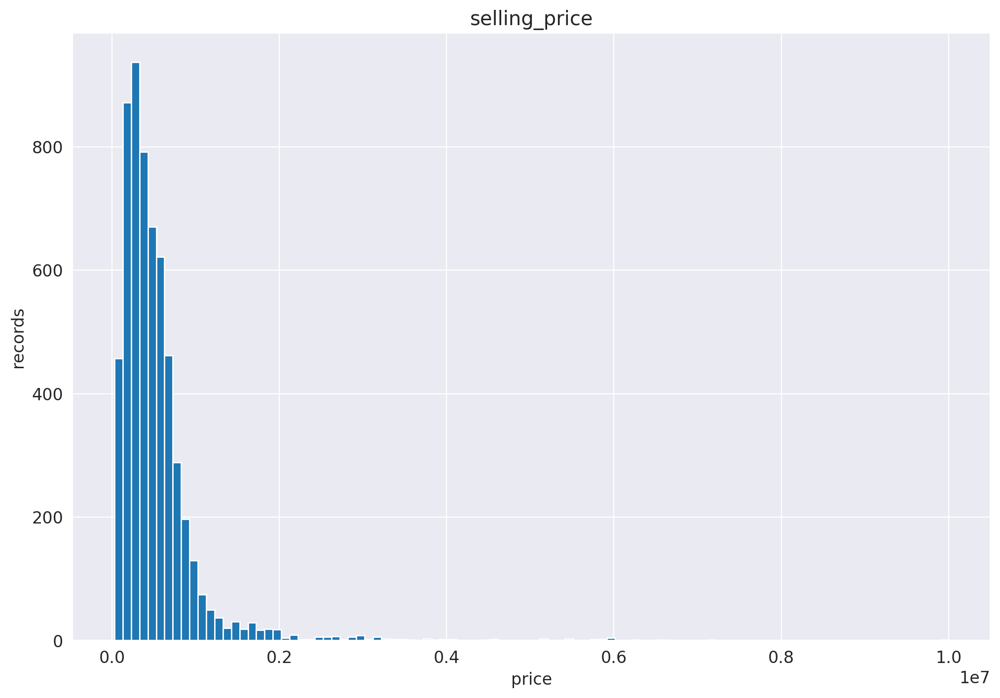

In [440]:
plt.hist(df_train_new[target_col], bins=100)
plt.title("selling_price")
plt.xlabel("price")
plt.ylabel("records")
plt.show()

Из гистограммы видно, что во-первых распределение целевой переменной имеет тяжёлый хвос (i.e. в данных есть много выбросов, которые представляют из себя слишком дорогие автомобили, которые нам предсказывать не выгодно, т.к. MSE чувствительна к выбросам), а во-вторых цена сама по себе измеряется в огромных единицах, из-за чего смотреть на ошибку MSE становится просто невозможно. Чтобы это исправить, будем в качестве целевой переменной использовать десятичный логофим цены.

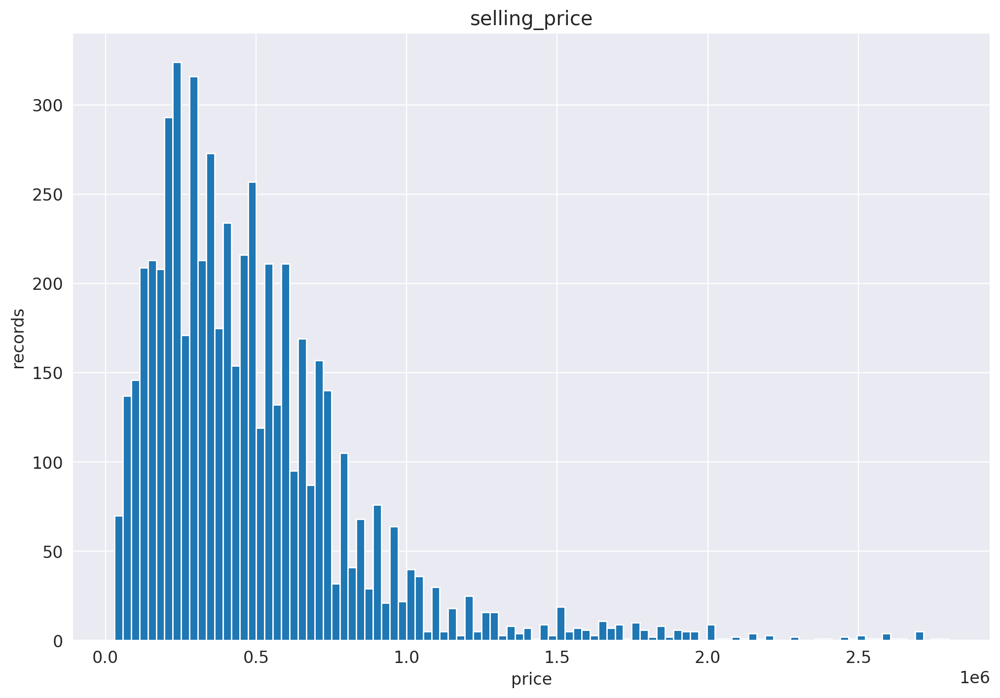

In [441]:
price = df_train_new[target_col]
# отрежем выбросы по 99 квантилю
df_train_new = df_train_new[price < np.quantile(price, 0.99)]
plt.hist(df_train_new[target_col], bins=100)
plt.title("selling_price")
plt.xlabel("price")
plt.ylabel("records")
plt.show()

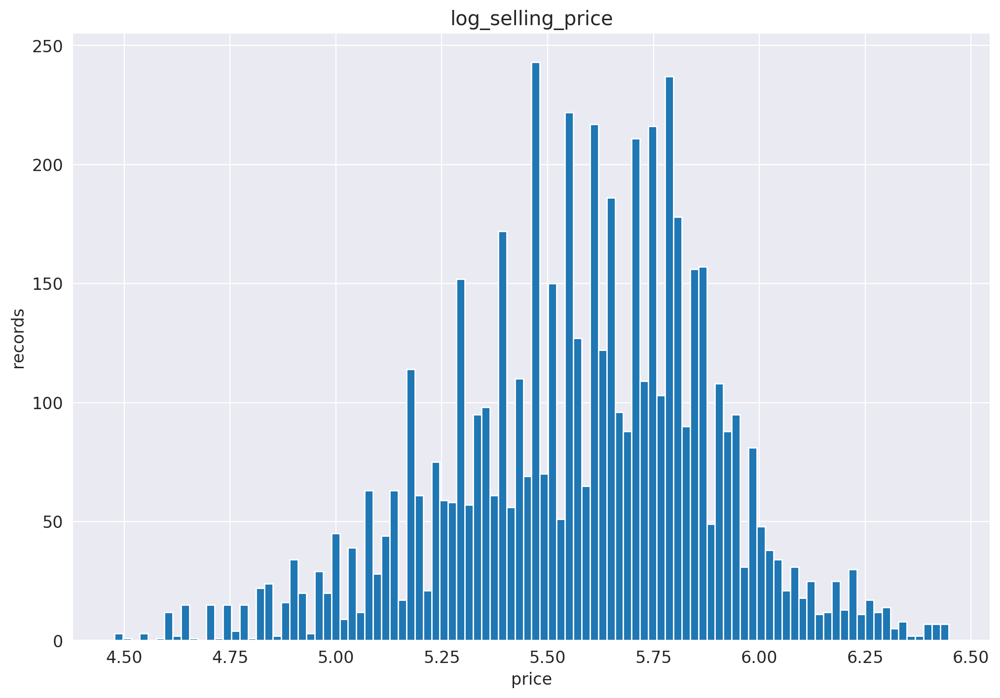

In [442]:
# в качестве целевой переменной будем использовать десятичный логарифм цены
log_price = np.log10(df_train_new[target_col])
df_train_new["log_selling_price"] = log_price
plt.hist(log_price, bins=100)
plt.title("log_selling_price")
plt.xlabel("price")
plt.ylabel("records")
plt.show()

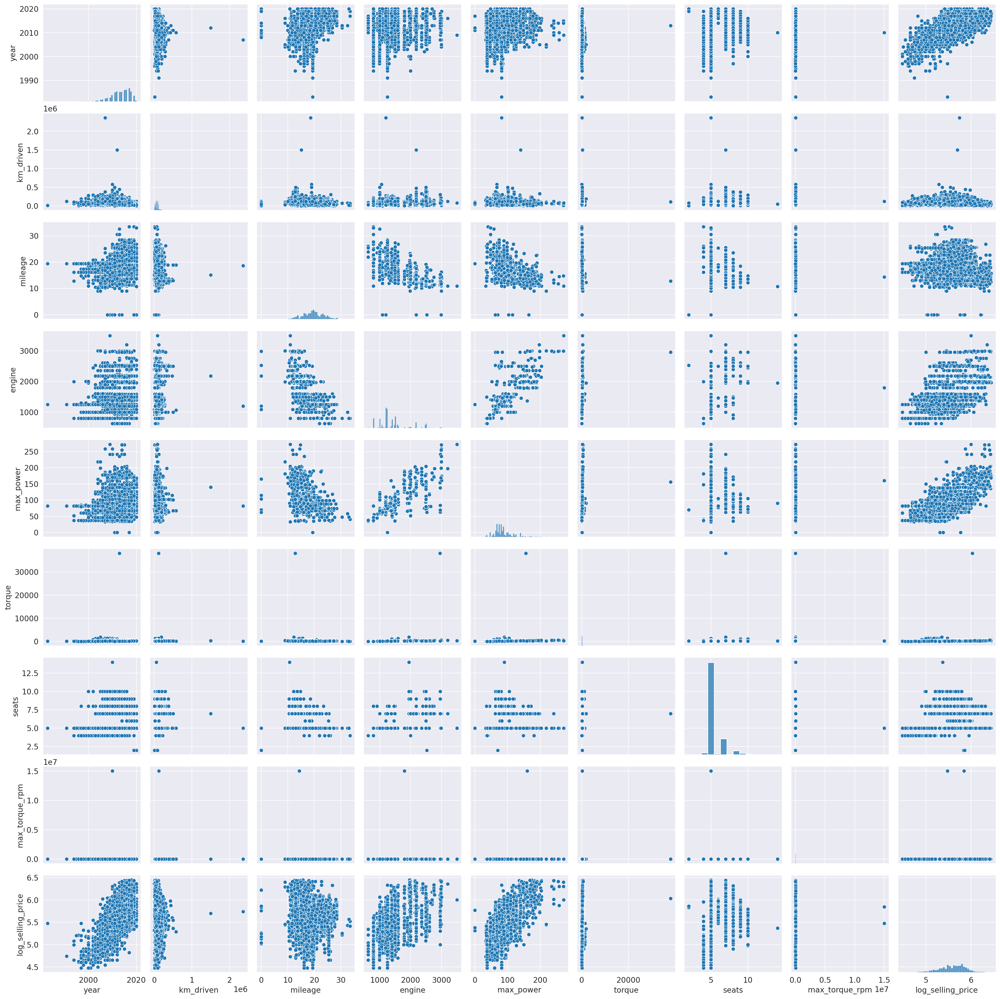

In [443]:
df_train_new = df_train_new.drop(columns=target_col)
target_col = "log_selling_price"
# снова посмотрим на попарные распределения
sns.pairplot(df_train_new)

Теперь немного поработаем с годом: для начала посмотрим на распределения. Кроме того сделаем ещё такое преобразование: вычтем минимальный год, чтобы получить некоторую точку отсчёта. Кроме того дальше мы будем нормировать признак используя min-max scaler, а не standart scaler, чтобы значения признака не стали отрицательными (т.к. они не могут быть отрицательными).

In [444]:
base_year = df_train_new["year"].min()
minmax_cols = ["year"]
binary_cols = []

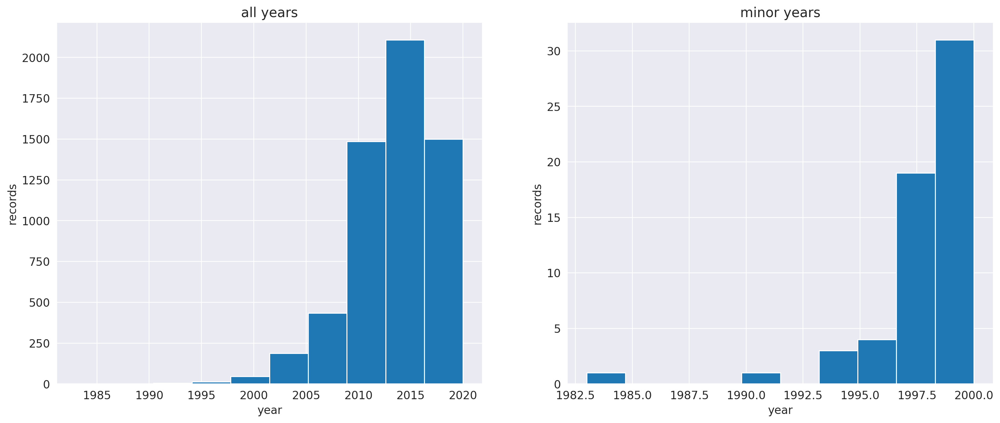

In [445]:
minor_years = df_train_new[df_train_new["year"] <= 2000]

f, ax = plt.subplots(ncols=2, nrows=1, figsize=(18, 7))
ax[0].set(title="all years", xlabel="year", ylabel="records")
ax[1].set(title="minor years", xlabel="year", ylabel="records")

ax[0].hist(df_train_new["year"])
ax[1].hist(minor_years["year"])

plt.show()

Объединим года для которых в выборке не много записей. Кроме того добавим бинарный признак `old`, принимающий значение `1`, если автомобиль выпущен раньше $2001$ года.

In [446]:
df_train_new["old"] = (df_train_new["year"] < 2001).astype(int)
df_test_new["old"] = (df_test_new["year"] < 2001).astype(int)

df_train_new["year"] -= base_year
df_train_new.loc[df_train_new["old"] == 1, "year"] = 0
df_test_new["year"] -= base_year
df_test_new.loc[df_test_new["old"] == 1, "year"] = 0

binary_cols.append("old")

final_dict.update({"year": {"base_year": base_year, "year_tres": 2001}})

Перейдём к признаку `km_driven`.

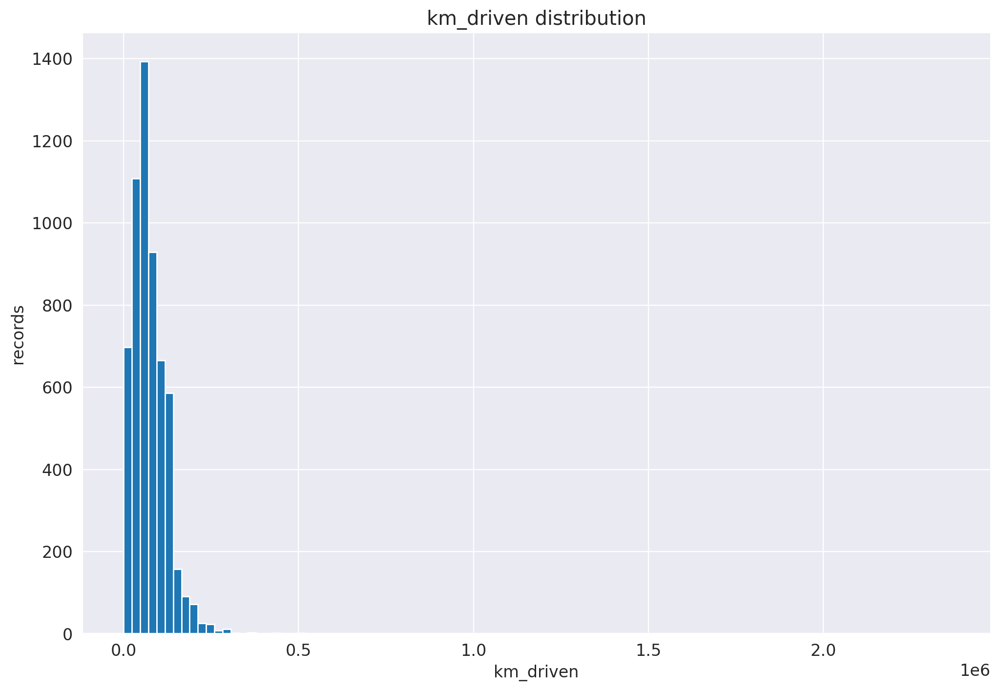

In [447]:
plt.hist(df_train_new["km_driven"], bins=100)
plt.title("km_driven distribution")
plt.xlabel("km_driven")
plt.ylabel("records")
plt.show()

Очень тяжёлый хвост. Посмотрим на цены объектов у которых высокие значения признака:

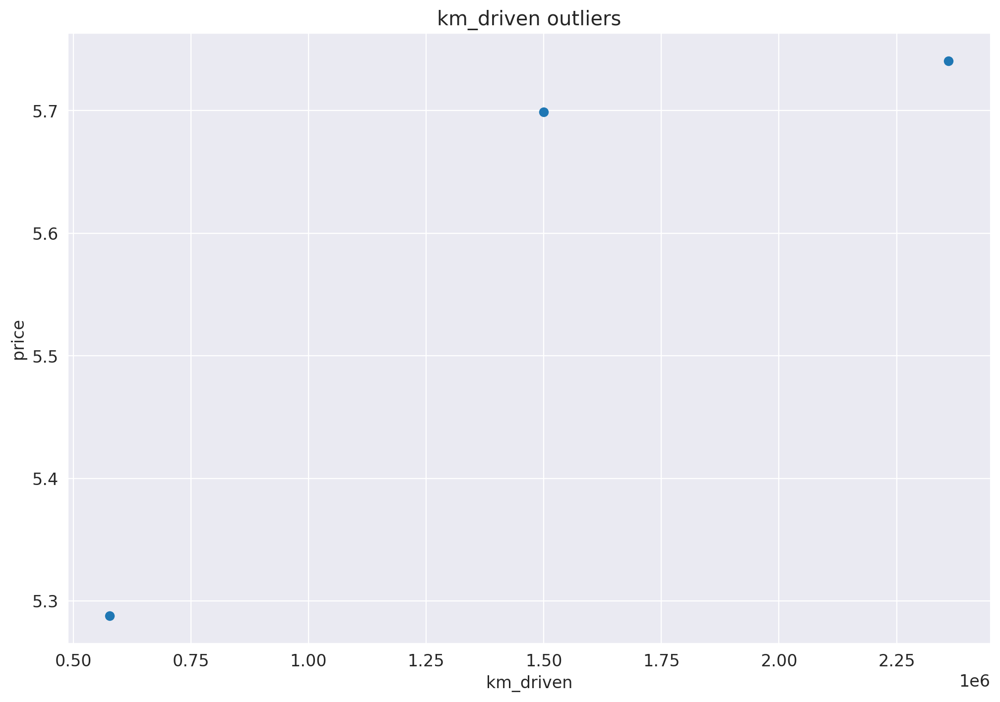

In [448]:
km_driven = df_train_new[df_train_new["km_driven"] > 0.5*1e6]

plt.scatter(km_driven["km_driven"], km_driven[target_col])
plt.title("km_driven outliers")
plt.xlabel("km_driven")
plt.ylabel("price")
plt.show()

Всего три объекта выброса с незначительным разбросом цен. Можно смело удалить эти объекты из обучающей выборки.

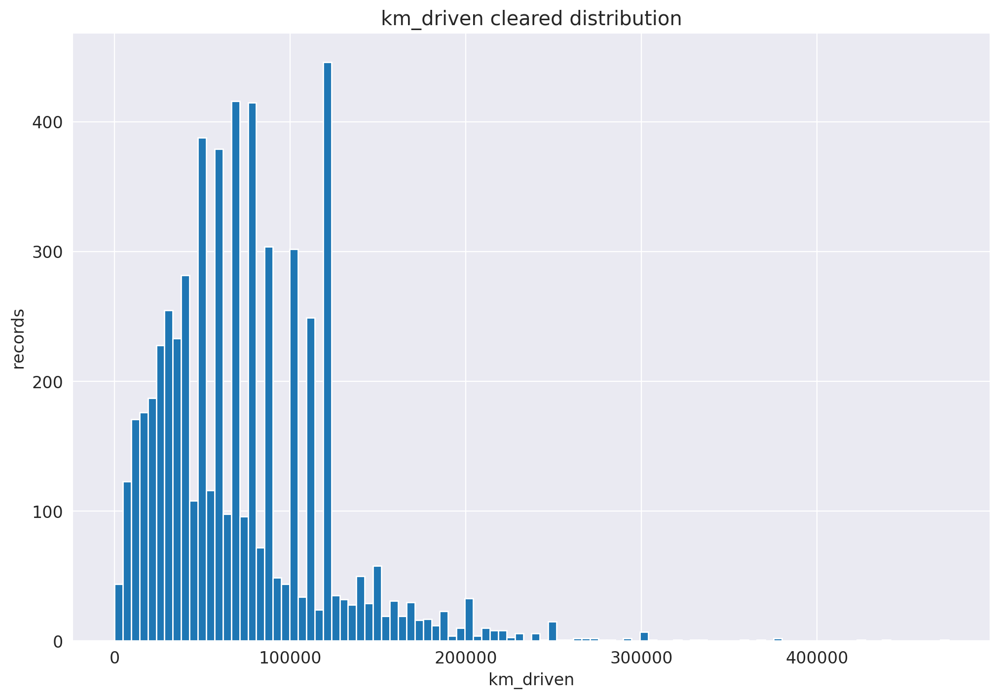

In [449]:
df_train_new = df_train_new[df_train_new["km_driven"] < 0.5*1e6]

plt.hist(df_train_new["km_driven"], bins=100)
plt.title("km_driven cleared distribution")
plt.xlabel("km_driven")
plt.ylabel("records")
plt.show()

Теперь можем нарисовать адекватную диаграмму рассеивания для `km_driven` и целевой переменной.

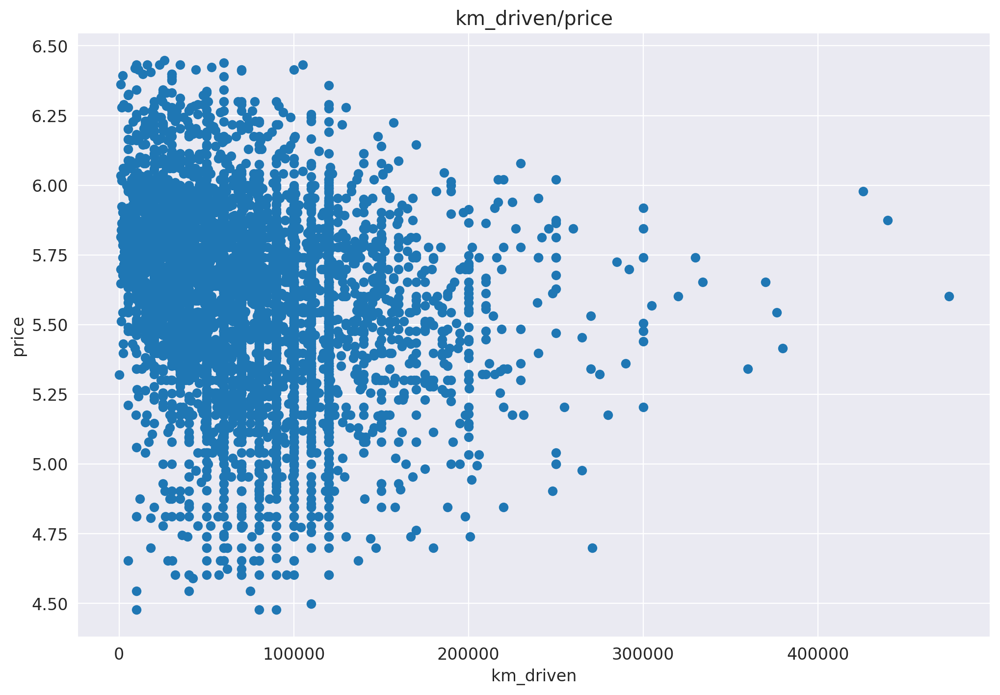

In [450]:
plt.scatter(df_train_new["km_driven"], df_train_new[target_col])
plt.title("km_driven/price")
plt.xlabel("km_driven")
plt.ylabel("price")
plt.show()

Никакой выразительной зависимости не наблюдается. Единственное что можно заметить: признак принимает довольно большие значения. Это значит что небольшие изменения в весе модели при этом признаке будут сильно отражаться на качестве. Чтобы это исправить, будем нормировать признак при помощи `minmax_scaler`, т.к. признак так же не может принимать отрицательные значения.

Другой вариант борьбы: разделить признак на бины, сделав его категориальным. Например автомобиль проехал менее 10'000 км и т.д. Прямо сейчас мы этого делать не будем, но на будующее запомним.

In [451]:
minmax_cols.append("km_driven")

Следующий признак на очереди: mileage. Посмотрим на его распределение, и пока забудем о том, что мы заполняли там пропуски медианами.

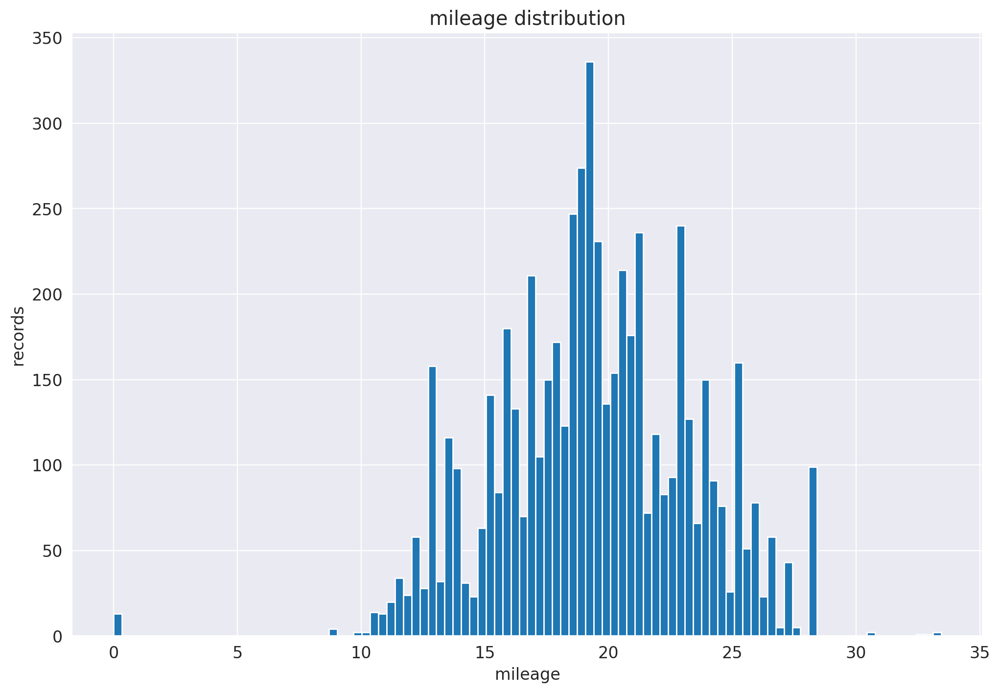

In [452]:
plt.hist(df_train_new["mileage"], bins=100)
plt.title("mileage distribution")
plt.xlabel("mileage")
plt.ylabel("records")
plt.show()

Мне нужно было однозначное определение того, что такое mileage, я загуглил и буду пользоваться этим
> The average number of miles a motor vehicle will travel on a gallon of gasoline that is used as a measure of fuel economy.

Переведём галлоны в литры, а мили в километры, т.к. у нас есть в данных другие признаки, котоыре измеряются в этих единицах. Кроме того из гистограммы видно, что есть какое-то количество объектов, у которых значение признака $0$. Удалим эти очевидные выбросы.

In [453]:
df_train_new.loc[:,"mileage"] = df_train["mileage"]
df_test_new.loc[:,"mileage"] = df_test["mileage"]

# df_train_new.loc[:, "mileage"]

<ipython-input-453-fa15e1b2eb1a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train_new.loc[:,"mileage"] = df_train["mileage"]


<ipython-input-454-c646026a751f>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train_new.loc[:,"mileage"] = df_train_new["mileage"] * (miles_to_km_const / gallons_to_litres)


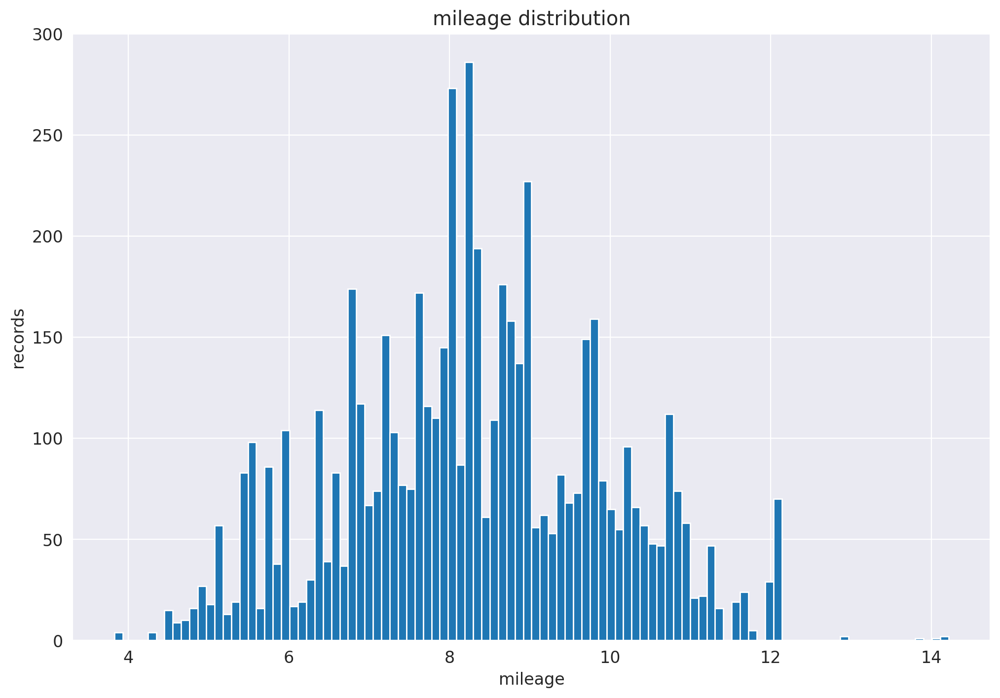

In [454]:
miles_to_km_const = 1.60934
gallons_to_litres = 3.78541

df_train_new = df_train_new[df_train_new["mileage"] > 0]
df_train_new.loc[:,"mileage"] = df_train_new["mileage"] * (miles_to_km_const / gallons_to_litres)
df_test_new.loc[:,"mileage"] = df_test_new["mileage"] * (miles_to_km_const / gallons_to_litres)

plt.hist(df_train_new["mileage"], bins=100)
plt.title("mileage distribution")
plt.xlabel("mileage")
plt.ylabel("records")
plt.show()

Хвост тяжеловат, посмотрим на него поближе

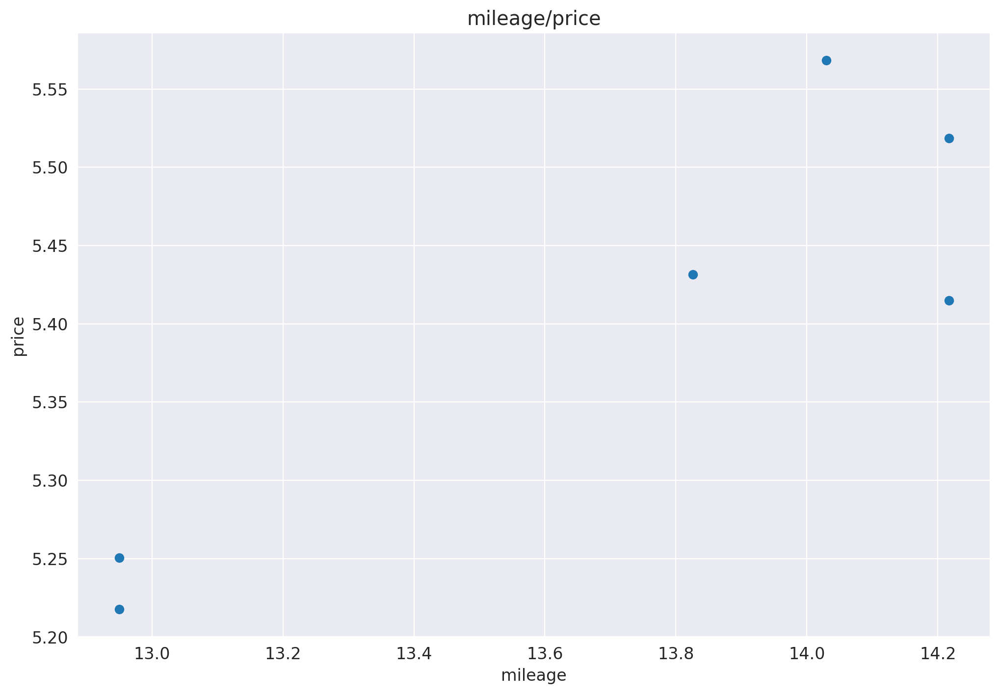

In [455]:
mileage_outliers = df_train_new.loc[df_train_new["mileage"] > 12.5]

plt.scatter(mileage_outliers["mileage"], mileage_outliers[target_col])
plt.title("mileage/price")
plt.xlabel("mileage")
plt.ylabel("price")
plt.show()

Записей не много, разброс незначительный. Вердикт: выкидываем. Нормировать будем так же minmax_scaler'ом.

In [456]:
df_train_new = df_train_new[df_train_new["mileage"] < 12.5]
minmax_cols.append("mileage")

Следующий признак: engine. Посмотрим на распределение и на диаграмму рассеяния с ценой, т.к. там есть на что посмотреть:

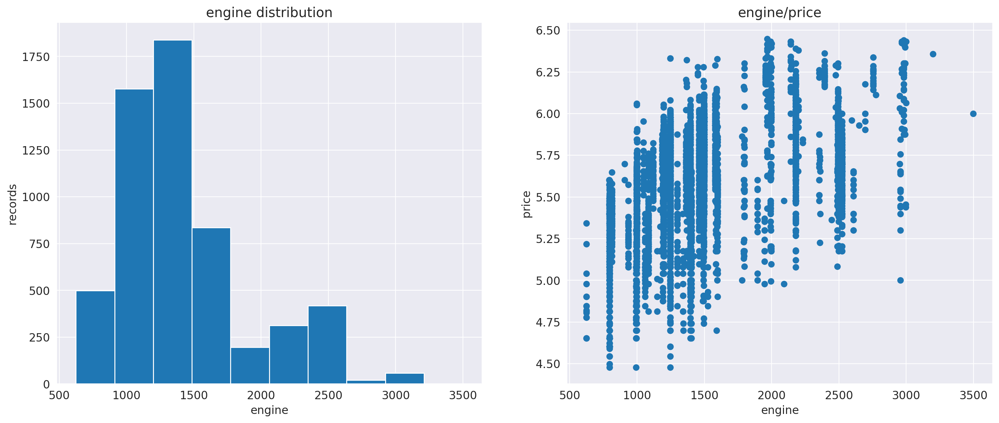

In [457]:
f, ax = plt.subplots(ncols=2, nrows=1, figsize=(18, 7))
ax[0].set(title="engine distribution", xlabel="engine", ylabel="records")
ax[1].set(title="engine/price", xlabel="engine", ylabel="price")

ax[0].hist(df_train_new["engine"])
ax[1].scatter(df_train_new["engine"], df_train_new[target_col])

plt.show()

Как мы видим, для каждого значения признака в данных устанавливаются чёткие границы минимального и максимального значений целевой переменной. С некоторого значения ценовые диапазоны начинают совпадать, но и до этого момента близкие значения признака соответствую близким диапазонам. Самое правильное, что можно сделать с этим признаком: объединить значения по близким ценовым диапазонам сделав таким образом признак категориальным.

In [458]:
def categorize_engine(data):
  data = data.copy()
  data["engine_0_1000"] = (data["engine"] <= 1000).astype(int)
  data["engine_1000_1250"] = ((1000 < data["engine"]) &
                              (data["engine"] <= 1250)).astype(int)
  data["engine_1250_1750"] = ((1250 < data["engine"]) &
                              (data["engine"] <= 1750)).astype(int)
  data["engine_1750_inf"] = (1750 < data["engine"]).astype(int)
  return data.drop(columns="engine")

In [459]:
df_train_new = categorize_engine(df_train_new)
df_test_new = categorize_engine(df_test_new)

binary_cols.extend(["engine_0_1000", "engine_1000_1250", "engine_1250_1750",
                         "engine_1750_inf"])

Эти новые признаки будут линейно зависимы со свободным членом, поэтому выкинем признак `engine_0_1000`

In [460]:
df_train_new = df_train_new.drop(columns="engine_0_1000")
df_test_new = df_test_new.drop(columns="engine_0_1000")
binary_cols.remove("engine_0_1000")

Идём дальше: max_power.

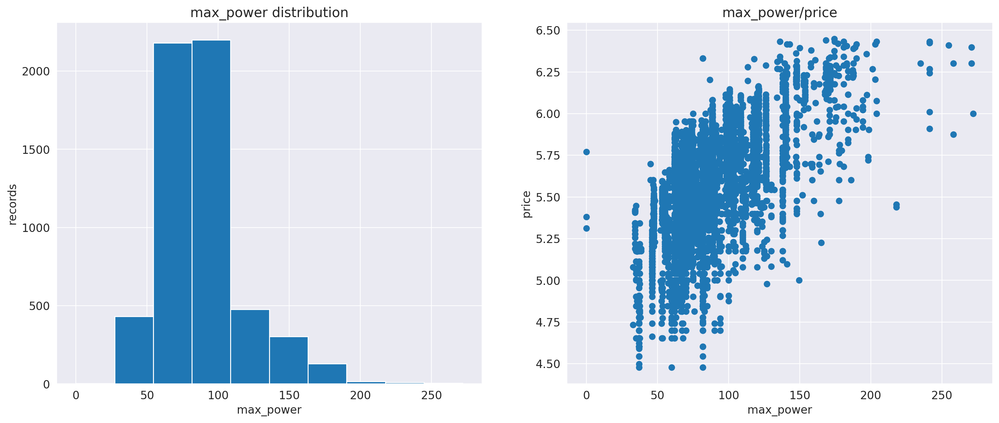

In [461]:
f, ax = plt.subplots(ncols=2, nrows=1, figsize=(18, 7))
ax[0].set(title="max_power distribution", xlabel="max_power", ylabel="records")
ax[1].set(title="max_power/price", xlabel="max_power", ylabel="price")

ax[0].hist(df_train_new["max_power"])
ax[1].scatter(df_train_new["max_power"], df_train_new[target_col])

plt.show()

Ситуация аналогична предыдущей. Поступим точно так же, но прежде выкинем выбросы с нулевым значением.

In [462]:
df_train_new = df_train_new[df_train_new["max_power"] > 0]

def categorize_max_power(data):
  data = data.copy()
  data["max_power_0_82"] = (data["max_power"] <= 82).astype(int)
  data["max_power_82_100"] = ((82 < data["max_power"]) & (data["max_power"] <= 100)).astype(int)
  data["max_power_100_145"] = ((100 < data["max_power"]) & (data["max_power"] <= 145)).astype(int)
  data["max_power_145_inf"] = (145 < data["max_power"]).astype(int)
  return data.drop(columns="max_power")

In [463]:
df_train_new = categorize_max_power(df_train_new)
df_test_new = categorize_max_power(df_test_new)

binary_cols.extend(["max_power_82_100", "max_power_100_145", "max_power_145_inf"])

df_train_new = df_train_new.drop(columns="max_power_0_82")
df_test_new = df_test_new.drop(columns="max_power_0_82")

Далее torque.

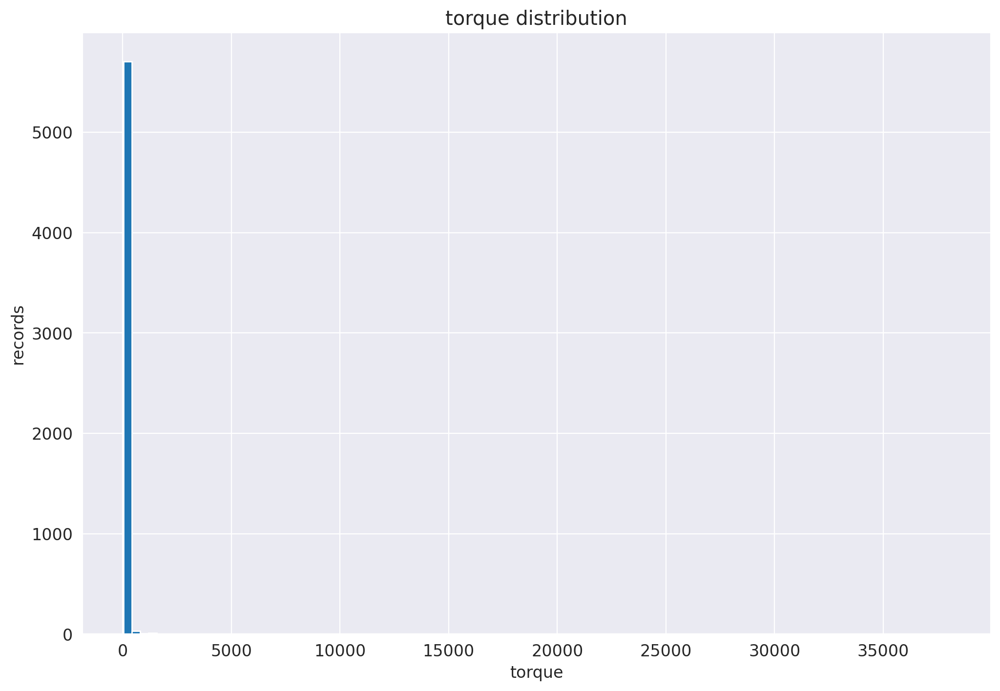

In [464]:
plt.hist(df_train_new["torque"], bins=100)
plt.title("torque distribution")
plt.xlabel("torque")
plt.ylabel("records")
plt.show()

И снова тяжёлый хвост. Там единственная запись, поэтому удалим её.

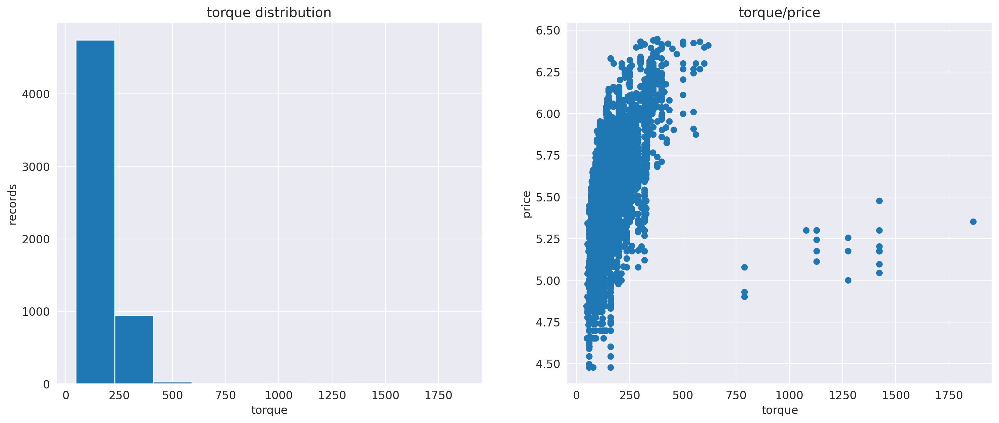

In [465]:
df_train_new = df_train_new[df_train_new["torque"] < 5000]

f, ax = plt.subplots(ncols=2, nrows=1, figsize=(18, 7))
ax[0].set(title="torque distribution", xlabel="torque", ylabel="records")
ax[1].set(title="torque/price", xlabel="torque", ylabel="price")

ax[0].hist(df_train_new["torque"])
ax[1].scatter((df_train_new["torque"]), df_train_new[target_col])

plt.show()

С одной стороны тут явно снова ситуация с ценовыми диапазонами. С другой: цена явно зависит логарифмически от признака. Прологорифмируем признак и посмотрим на диаграмму снова.

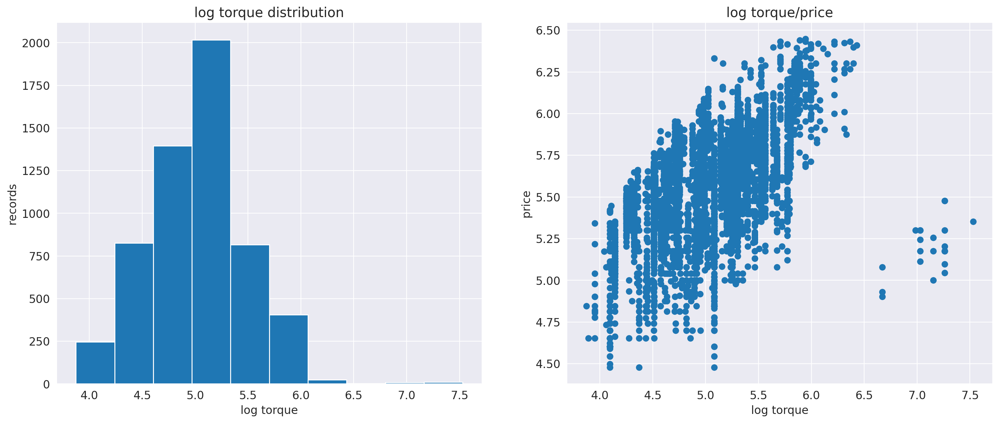

In [466]:
log_torque = np.log1p(df_train_new["torque"])

f, ax = plt.subplots(ncols=2, nrows=1, figsize=(18, 7))
ax[0].set(title="log torque distribution", xlabel="log torque", ylabel="records")
ax[1].set(title="log torque/price", xlabel="log torque", ylabel="price")

ax[0].hist(log_torque)
ax[1].scatter((log_torque), df_train_new[target_col])

plt.show()

Тут явно видно три порога, по которым можно разбить признак на бины. Но с другой стороны целевая переменная зависит явно линейно от логарифмированного признака (за исключением небольшого куска справа). Запомним, что признак можно неплохо бинаризовать, но пока будем считать его числовым, и нормировать при помощи minmax scaler.

In [467]:
df_train_new["log_torque"] = np.log1p(df_train_new["torque"])
df_test_new["log_torque"] = np.log1p(df_test_new["torque"])

minmax_cols.append("log_torque")

Далее, seats.

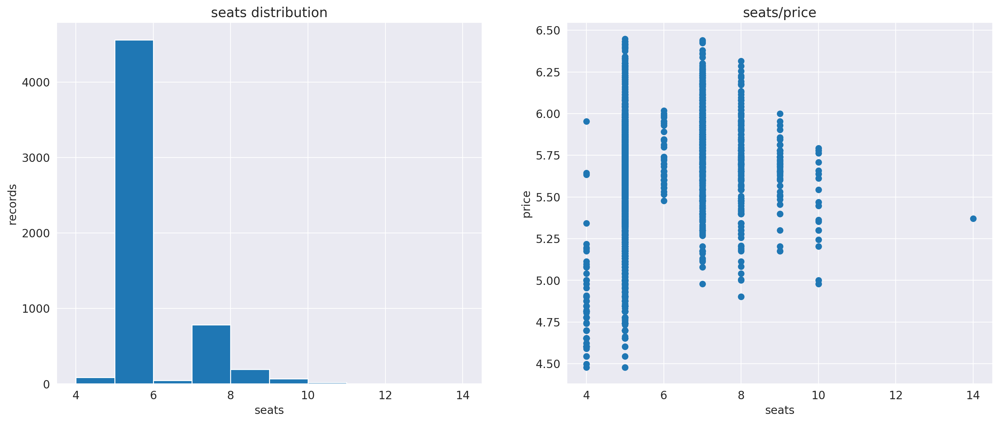

In [468]:
f, ax = plt.subplots(ncols=2, nrows=1, figsize=(18, 7))
ax[0].set(title="seats distribution", xlabel="seats", ylabel="records")
ax[1].set(title="seats/price", xlabel="seats", ylabel="price")

ax[0].hist(df_train_new["seats"])
ax[1].scatter(df_train_new["seats"], df_train_new[target_col])

plt.show()

Явно категориальный признак. Выкинем единственную запись со значением признака $14$, т.к. цена у этого объекта примерно равна средней по датасету.

In [469]:
df_train_new = df_train_new[df_train_new["seats"] < 14]
categorical_cols.append("seats")

Последний числовой признак: max_torque_rpm.

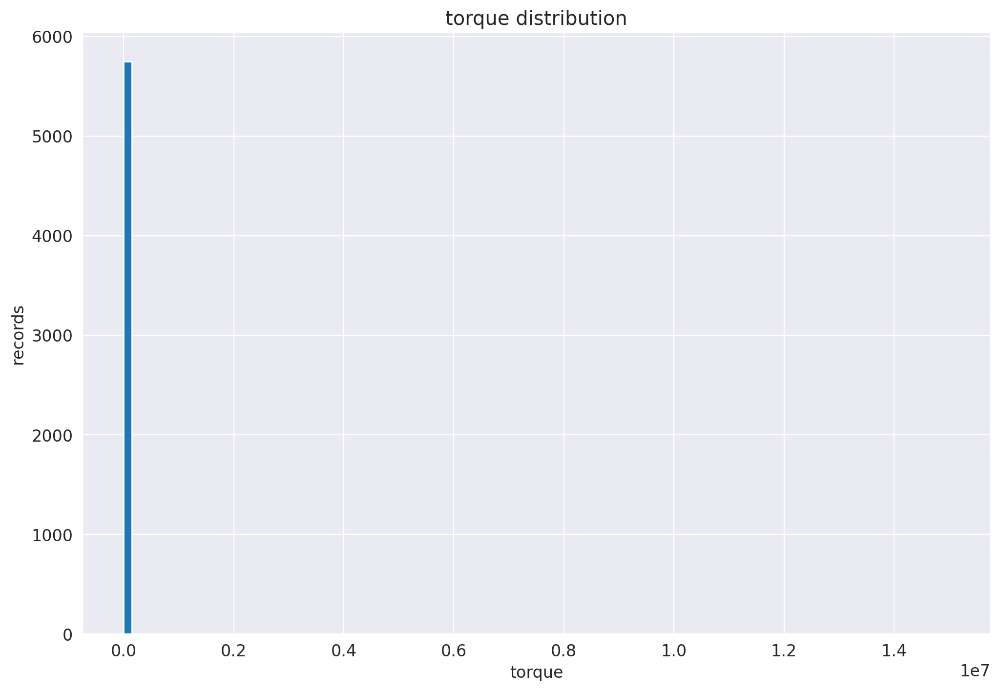

In [470]:
plt.hist(df_train_new["max_torque_rpm"], bins=100)
plt.title("torque distribution")
plt.xlabel("torque")
plt.ylabel("records")
plt.show()

Избавимся от тяжёлого хвоста.

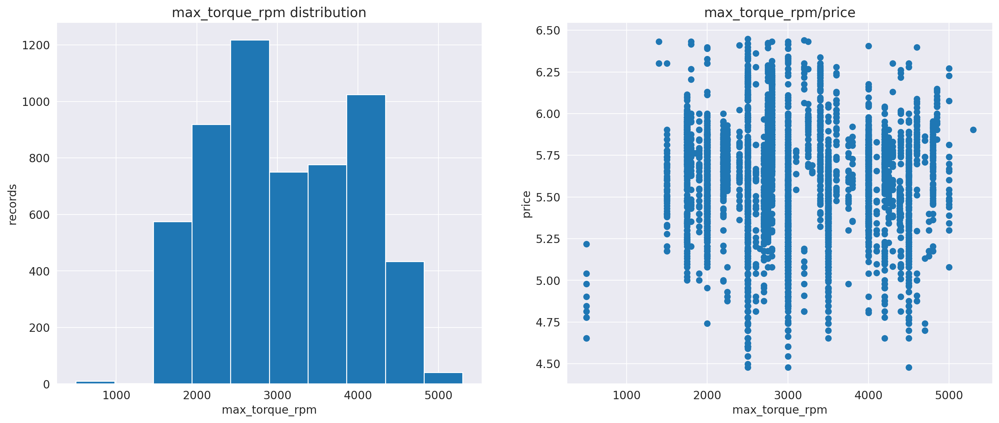

In [471]:
df_train_new = df_train_new[df_train_new["max_torque_rpm"] < 20_000]

f, ax = plt.subplots(ncols=2, nrows=1, figsize=(18, 7))
ax[0].set(title="max_torque_rpm distribution", xlabel="max_torque_rpm", ylabel="records")
ax[1].set(title="max_torque_rpm/price", xlabel="max_torque_rpm", ylabel="price")

ax[0].hist(df_train_new["max_torque_rpm"])
ax[1].scatter(df_train_new["max_torque_rpm"], df_train_new[target_col])

plt.show()

In [472]:
minmax_cols.append("max_torque_rpm")

Виден тренд на постепенное расширение диапазона, потом сужение, и снова расширение, однако данных маловато, чтобы утверждать это однозначно. Пока ничего больше не будем делать с признаком, но запомним, что его можно попробовать бинаризовать.

Снова нарисуем попарные распределения для очищенной выборки:

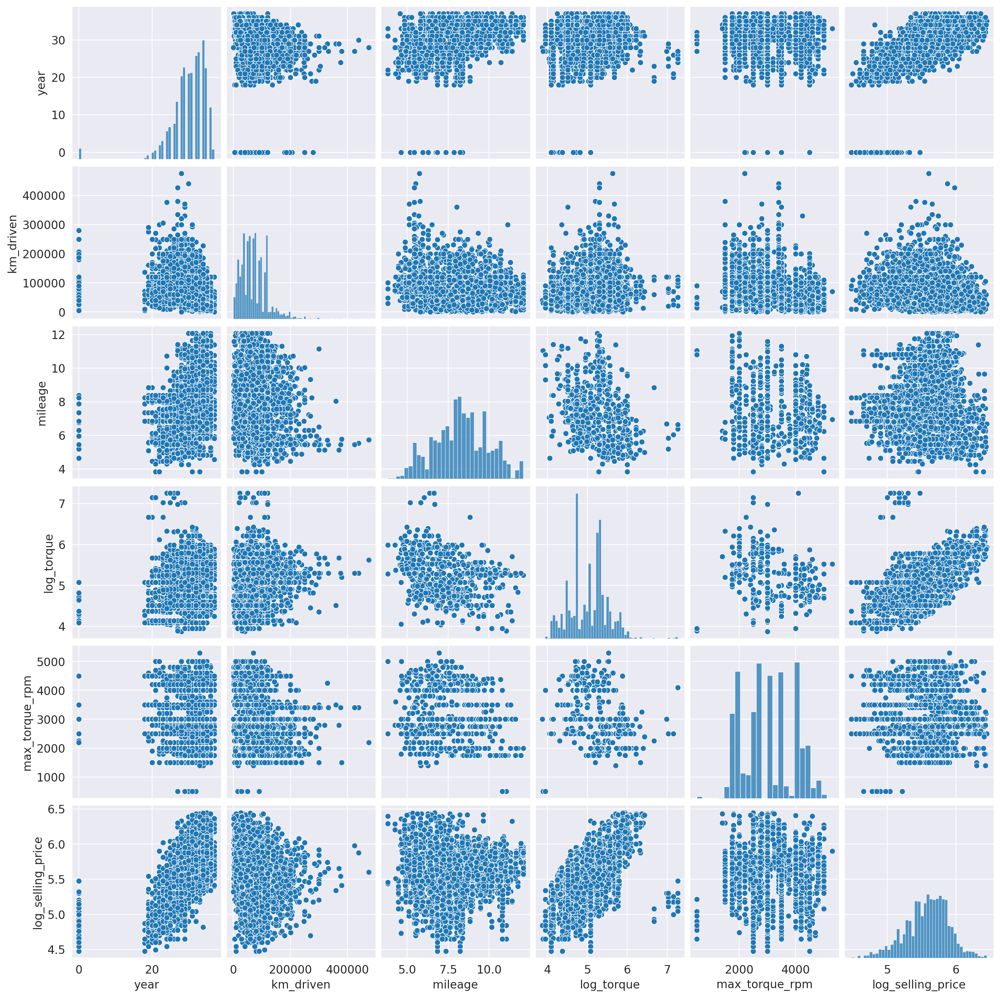

In [473]:
sns.pairplot(df_train_new, vars=minmax_cols + [target_col])

У нас так же осталось ещё нескольно категориальных признаков. Посмотрим их

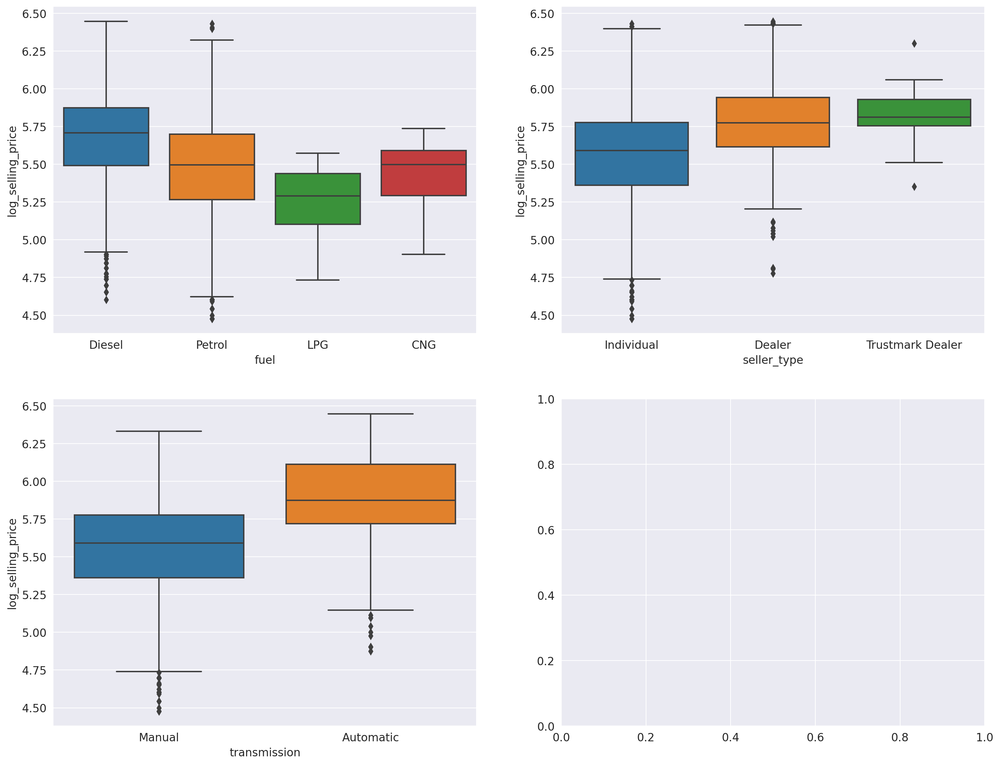

In [474]:
# df_train_new
f, ax = plt.subplots(ncols=2, nrows=2, figsize=(18, 14))

sns.boxplot(x="fuel", y=target_col, data=df_train_new, ax=ax[0, 0])
sns.boxplot(x="seller_type", y=target_col, data=df_train_new, ax=ax[0, 1])
sns.boxplot(x="transmission", y=target_col, data=df_train_new, ax=ax[1, 0])

plt.show()

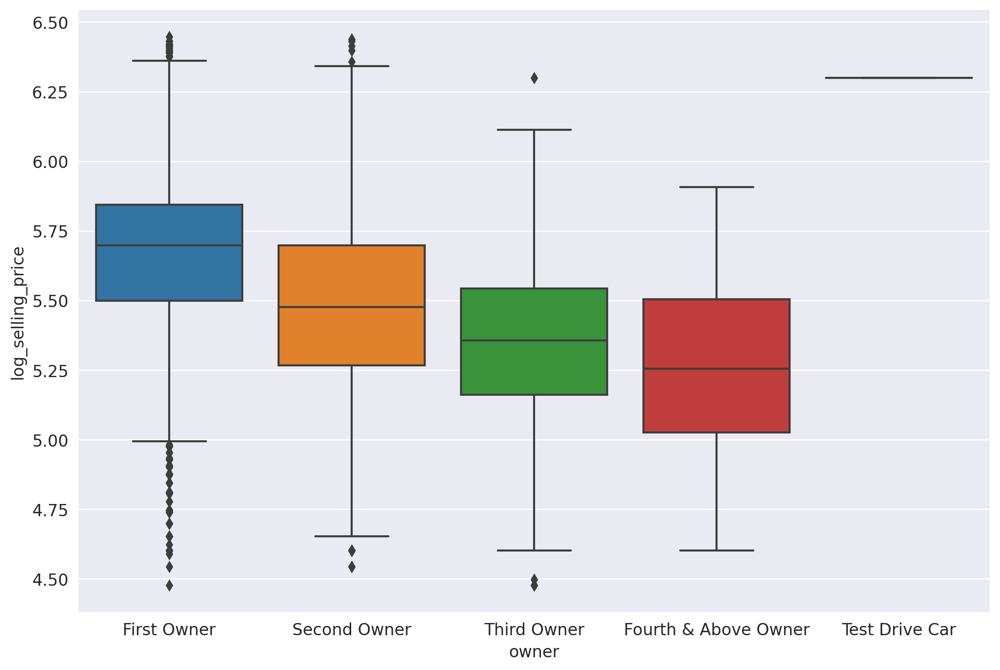

In [475]:
plt.show(sns.boxplot(x="owner", y=target_col, data=df_train_new))

Удалим категорию с единственной записью.

In [476]:
df_train_new = df_train_new[df_train_new["owner"] != "Test Drive Car"]

Посмотрим на количество записей для разных категорий признака fuel:

In [477]:
df_train_new["fuel"].value_counts()

Diesel    3114
Petrol    2556
CNG         44
LPG         34
Name: fuel, dtype: int64

Объединим категории CNG и LPG в новую категорию other.

In [478]:
df_train_new.loc[(df_train_new["fuel"] != "Diesel") & ((df_train_new["fuel"] != "Petrol")), "fuel"] = "other"
df_test_new.loc[(df_test_new["fuel"] != "Diesel") & ((df_test_new["fuel"] != "Petrol")), "fuel"] = "other"

Пока чистить больше нечего, обучим модель.

In [479]:
categorical_cols = list(set(categorical_cols) - set(binary_cols))

In [480]:
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import MinMaxScaler

identity = FunctionTransformer(lambda x: x)
ohe = OneHotEncoder(drop="first", handle_unknown="ignore", sparse_output=False)
std = MinMaxScaler()
column_transformer = ColumnTransformer([
    ("identity", identity, binary_cols),
    ("ohe", ohe, categorical_cols),
    ("scaling", std, minmax_cols)
], remainder="drop", n_jobs=2)

X_train = column_transformer.fit_transform(df_train_new)
y_train = df_train_new[target_col].values
X_test = column_transformer.transform(df_test_new)
y_test = np.log10(df_test_new["selling_price"].values)

grid_search = GridSearchCV(Ridge(), {
    "alpha": np.logspace(-4, 5, 10),
    "max_iter": [100, 500, 1000, 2500, 5000],
    "tol": [1e-4, 1e-3, 1e-2, 1e-1]
}, cv=10, scoring=lambda c, x, y: r2_score(y, c.predict(x)), refit=False)

grid_search.fit(X_train, y_train)
best = grid_search.cv_results_["mean_test_score"].argmax()
best_params = grid_search.cv_results_["params"][best]
best_params

{'alpha': 0.1, 'max_iter': 100, 'tol': 0.0001}

In [486]:
def evaluate_log_clear(model, X_train, y_train, X_test, y_test):
  print("log price predictions")
  evaluate(model, X_train, y_train, X_test, y_test)
  print("\n\n")
  print("price predictions")
  y_pred_train = 10 ** model.predict(X_train)
  y_pred_test = 10 ** model.predict(X_test)
  print("Train data metrics:")
  print("R2 score:", r2_score(10 ** y_train, y_pred_train))
  print("MSE:",MSE(10 ** y_train, y_pred_train))
  print("---------------------------------")
  print("Test data metrics:")
  print("R2 score:", r2_score(10 ** y_test, y_pred_test))
  print("MSE:",MSE(10 ** y_test, y_pred_test))

In [487]:
linreg = Ridge(**best_params).fit(X_train, y_train)
evaluate_log_clear(linreg, X_train, y_train, X_test, y_test)

log price predictions
Train data metrics:
R2 score: 0.8337984900808706
MSE: 0.016702904620635464
---------------------------------
Test data metrics:
R2 score: 0.8570954661822727
MSE: 0.01928000765247822



price predictions
Train data metrics:
R2 score: 0.785232889410642
MSE: 27602198098.510967
---------------------------------
Test data metrics:
R2 score: 0.6714108627106268
MSE: 188882419186.53296


$R^2$ до чистки: $0.63$;  
$R^2$ после чистки: $0.67$;

## Рожаем новые признаки

In [488]:
from bs4 import BeautifulSoup

marks = """
<td width="25%" valign="top" nowrap=""><ul class="category2"><li><h4><a href="https://acura.drom.ru/">Acura</a></h4></li><li><h4><a href="https://alfa-romeo.drom.ru/">Alfa Romeo</a></h4></li><li><h4><a href="https://alpina.drom.ru/">Alpina</a></h4></li><li><h4><a href="https://asia.drom.ru/">Asia</a></h4></li><li><h4><a href="https://aston-martin.drom.ru/">Aston Martin</a></h4></li><li><h4><a href="https://audi.drom.ru/">Audi</a></h4></li><li><h4><a href="https://bentley.drom.ru/">Bentley</a></h4></li><li><h4><a href="https://bmw.drom.ru/">BMW</a></h4></li><li><h4><a href="https://brilliance.drom.ru/">Brilliance</a></h4></li><li><h4><a href="https://bugatti.drom.ru/">Bugatti</a></h4></li><li><h4><a href="https://buick.drom.ru/">Buick</a></h4></li><li><h4><a href="https://byd.drom.ru/">BYD</a></h4></li><li><h4><a href="https://cadillac.drom.ru/">Cadillac</a></h4></li><li><h4><a href="https://changan.drom.ru/">Changan</a></h4></li><li><h4><a href="https://chery.drom.ru/">Chery</a></h4></li><li><h4><a href="https://chevrolet.drom.ru/">Chevrolet</a></h4></li><li><h4><a href="https://chrysler.drom.ru/">Chrysler</a></h4></li><li><h4><a href="https://citroen.drom.ru/">Citroen</a></h4></li><li><h4><a href="https://dacia.drom.ru/">Dacia</a></h4></li><li><h4><a href="https://daewoo.drom.ru/">Daewoo</a></h4></li><li><h4><a href="https://daihatsu.drom.ru/">Daihatsu</a></h4></li><li><h4><a href="https://datsun.drom.ru/">Datsun</a></h4></li><li><h4><a href="https://delorean.drom.ru/">DeLorean</a></h4></li><li><h4><a href="https://derways.drom.ru/">Derways</a></h4></li><li><h4><a href="https://dodge.drom.ru/">Dodge</a></h4></li><li><h4><a href="https://dongfeng.drom.ru/">Dongfeng</a></h4></li><li><h4><a href="https://faw.drom.ru/">FAW</a></h4></li><li><h4><a href="https://ferrari.drom.ru/">Ferrari</a></h4></li></ul></td><td width="%25" valign="top" nowrap=""><ul class="category2"><li><h4><a href="https://fiat.drom.ru/">Fiat</a></h4></li><li><h4><a href="https://ford.drom.ru/">Ford</a></h4></li><li><h4><a href="https://foton.drom.ru/">Foton</a></h4></li><li><h4><a href="https://freightliner.drom.ru/">Freightliner</a></h4></li><li><h4><a href="https://geely.drom.ru/">Geely</a></h4></li><li><h4><a href="https://genesis.drom.ru/">Genesis</a></h4></li><li><h4><a href="https://gmc.drom.ru/">GMC</a></h4></li><li><h4><a href="https://great-wall.drom.ru/">Great Wall</a></h4></li><li><h4><a href="https://hafei.drom.ru/">Hafei</a></h4></li><li><h4><a href="https://haima.drom.ru/">Haima</a></h4></li><li><h4><a href="https://haval.drom.ru/">Haval</a></h4></li><li><h4><a href="https://hawtai.drom.ru/">Hawtai</a></h4></li><li><h4><a href="https://hino.drom.ru/">Hino</a></h4></li><li><h4><a href="https://honda.drom.ru/">Honda</a></h4></li><li><h4><a href="https://hummer.drom.ru/">Hummer</a></h4></li><li><h4><a href="https://hyundai.drom.ru/">Hyundai</a></h4></li><li><h4><a href="https://infiniti.drom.ru/">Infiniti</a></h4></li><li><h4><a href="https://iran-khodro.drom.ru/">Iran Khodro</a></h4></li><li><h4><a href="https://isuzu.drom.ru/">Isuzu</a></h4></li><li><h4><a href="https://jac.drom.ru/">JAC</a></h4></li><li><h4><a href="https://jaguar.drom.ru/">Jaguar</a></h4></li><li><h4><a href="https://jeep.drom.ru/">Jeep</a></h4></li><li><h4><a href="https://kia.drom.ru/">Kia</a></h4></li><li><h4><a href="https://koenigsegg.drom.ru/">Koenigsegg</a></h4></li><li><h4><a href="https://lamborghini.drom.ru/">Lamborghini</a></h4></li><li><h4><a href="https://lancia.drom.ru/">Lancia</a></h4></li><li><h4><a href="https://land-rover.drom.ru/">Land Rover</a></h4></li><li><h4><a href="https://lexus.drom.ru/">Lexus</a></h4></li></ul></td><td width="%25" valign="top" nowrap=""><ul class="category2"><li><h4><a href="https://lifan.drom.ru/">Lifan</a></h4></li><li><h4><a href="https://lincoln.drom.ru/">Lincoln</a></h4></li><li><h4><a href="https://lotus.drom.ru/">Lotus</a></h4></li><li><h4><a href="https://luxgen.drom.ru/">Luxgen</a></h4></li><li><h4><a href="https://marussia.drom.ru/">Marussia</a></h4></li><li><h4><a href="https://maserati.drom.ru/">Maserati</a></h4></li><li><h4><a href="https://maybach.drom.ru/">Maybach</a></h4></li><li><h4><a href="https://mazda.drom.ru/">Mazda</a></h4></li><li><h4><a href="https://mclaren.drom.ru/">McLaren</a></h4></li><li><h4><a href="https://mercedes-benz.drom.ru/">Mercedes-Benz</a></h4></li><li><h4><a href="https://mercury.drom.ru/">Mercury</a></h4></li><li><h4><a href="https://mini.drom.ru/">MINI</a></h4></li><li><h4><a href="https://mitsubishi.drom.ru/">Mitsubishi</a></h4></li><li><h4><a href="https://mitsuoka.drom.ru/">Mitsuoka</a></h4></li><li><h4><a href="https://nissan.drom.ru/">Nissan</a></h4></li><li><h4><a href="https://oldsmobile.drom.ru/">Oldsmobile</a></h4></li><li><h4><a href="https://opel.drom.ru/">Opel</a></h4></li><li><h4><a href="https://pagani.drom.ru/">Pagani</a></h4></li><li><h4><a href="https://peugeot.drom.ru/">Peugeot</a></h4></li><li><h4><a href="https://plymouth.drom.ru/">Plymouth</a></h4></li><li><h4><a href="https://pontiac.drom.ru/">Pontiac</a></h4></li><li><h4><a href="https://porsche.drom.ru/">Porsche</a></h4></li><li><h4><a href="https://proton.drom.ru/">Proton</a></h4></li><li><h4><a href="https://ravon.drom.ru/">Ravon</a></h4></li><li><h4><a href="https://renault.drom.ru/">Renault</a></h4></li><li><h4><a href="https://renault-samsung.drom.ru/">Renault Samsung</a></h4></li><li><h4><a href="https://rolls-royce.drom.ru/">Rolls-Royce</a></h4></li><li><h4><a href="https://rover.drom.ru/">Rover</a></h4></li></ul></td><td width="%25" valign="top" nowrap=""><ul class="category2"><li><h4><a href="https://saab.drom.ru/">Saab</a></h4></li><li><h4><a href="https://saturn.drom.ru/">Saturn</a></h4></li><li><h4><a href="https://scion.drom.ru/">Scion</a></h4></li><li><h4><a href="https://seat.drom.ru/">SEAT</a></h4></li><li><h4><a href="https://skoda.drom.ru/">Skoda</a></h4></li><li><h4><a href="https://smart.drom.ru/">Smart</a></h4></li><li><h4><a href="https://ssang-yong.drom.ru/">SsangYong</a></h4></li><li><h4><a href="https://subaru.drom.ru/">Subaru</a></h4></li><li><h4><a href="https://suzuki.drom.ru/">Suzuki</a></h4></li><li><h4><a href="https://tesla.drom.ru/">Tesla</a></h4></li><li><h4><a href="https://tianye.drom.ru/">Tianye</a></h4></li><li><h4><a href="https://toyota.drom.ru/">Toyota</a></h4></li><li><h4><a href="https://volkswagen.drom.ru/">Volkswagen</a></h4></li><li><h4><a href="https://volvo.drom.ru/">Volvo</a></h4></li><li><h4><a href="https://vortex.drom.ru/">Vortex</a></h4></li><li><h4><a href="https://zotye.drom.ru/">Zotye</a></h4></li><li><h4><a href="https://zx.drom.ru/">ZX</a></h4></li><li><h4><a href="https://aurus.drom.ru/">Аурус</a></h4></li><li><h4><a href="https://gaz.drom.ru/">ГАЗ</a></h4></li><li><h4><a href="https://zaz.drom.ru/">ЗАЗ</a></h4></li><li><h4><a href="https://izh.drom.ru/">ИЖ</a></h4></li><li><h4><a href="https://lada.drom.ru/">ВАЗ</a></h4></li><li><h4><a href="https://luaz.drom.ru/">ЛуАЗ</a></h4></li><li><h4><a href="https://moskvitch.drom.ru/">Москвич</a></h4></li><li><h4><a href="https://tagaz.drom.ru/">ТагАЗ</a></h4></li><li><h4><a href="https://uaz.drom.ru/">УАЗ</a></h4></li></ul></td>    <td class="imgR">&nbsp;</td>
"""

soup = BeautifulSoup(marks, 'html.parser')
marks = {link.text.lower() for link in soup.findAll("a")}

In [489]:
def get_car_make(name_list):
  for name in name_list:
    if name in marks:
      return name
    return "no mark"

train_makes = df_train_new["name"].apply(lambda x: get_car_make(x.lower().split()))
test_makes = df_test_new["name"].apply(lambda x: get_car_make(x.lower().split()))

df_train_new["car_make"] = train_makes
df_test_new["car_make"] = test_makes

<ipython-input-489-971c0e62fda2>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train_new["car_make"] = train_makes


Что тут произошло: я нагуглил список марок автомобилей, скопировал соответствующий HTML код, распарсил его и получил python set с марками, и дальше вытащил марки из названий автомобилей. Не всегда в названии автомобиля пишется его бренд, поэтому пропуски я заполнил специальным значением `no mark`. Теперь посмотрим на распределение цен в зависимости от бренда.

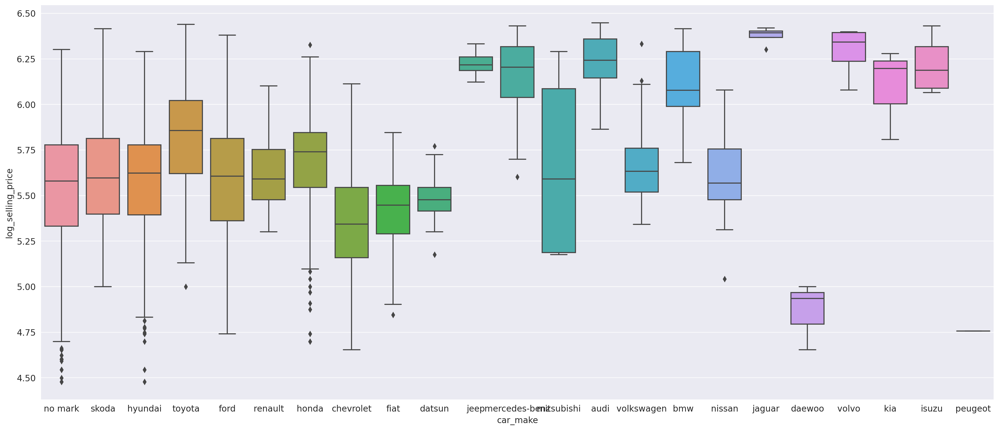

In [490]:
plt.figure(figsize=(24, 10))
plt.show(sns.boxplot(x="car_make", y=target_col, data=df_train_new))

График показывает, что признак может быть очень полезен. Единственное что, у нас есть единственная запись для автомобиля peugeot, поэтому мы объединим эту категорию с `no mark`. Теперь попробуем методом пристального взгляда в данные уменьшить число записей, для которых бренд не определился.

In [491]:
nonames = df_train_new[df_train_new["car_make"] == "no mark"]["name"]
nonames = nonames.apply(lambda x: x.lower().split()[0])
nonames.unique()

array(['maruti', 'mahindra', 'tata', 'mg', 'force', 'ambassador', 'land'],
      dtype=object)

Нужно учесть, что автомобили марки `suzuki` в данных имеют бренд `maruti`.
Кроме того я обнаружил ещё два пропущенных бренда: `Mahindra` и `Tata`.

In [492]:
marks = marks | {"mahindra", "tata", "maruti"}

train_makes = df_train_new["name"].apply(lambda x: get_car_make(x.lower().split()))
test_makes = df_test_new["name"].apply(lambda x: get_car_make(x.lower().split()))

df_train_new["car_make"] = train_makes
df_test_new["car_make"] = test_makes

df_train_new.loc[df_train_new["car_make"] == "suzuki", "car_make"] = "maruti"
df_test_new.loc[df_test_new["car_make"] == "suzuki", "car_make"] = "maruti"

df_train_new.loc[df_train_new["car_make"] == "peugeot", "car_make"] = "no mark"

<ipython-input-492-018584918561>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train_new["car_make"] = train_makes


In [493]:
df_train_new[df_train_new["car_make"] == "no mark"]

,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,torque,seats,...,log_selling_price,old,engine_1000_1250,engine_1250_1750,engine_1750_inf,max_power_82_100,max_power_100_145,max_power_145_inf,log_torque,car_make
127,MG Hector Sharp AT BSIV,36,19000,Petrol,Dealer,Automatic,First Owner,5.934994,250.0,5,...,6.243038,0,0,1,0,0,1,0,5.525453,no mark
1533,Force Gurkha Hard Top BS3 4WD,35,20000,Diesel,Dealer,Manual,First Owner,7.227428,230.0,5,...,5.959041,0,0,0,1,0,0,0,5.442418,no mark
1539,MG Hector Sharp DCT Dualtone,37,1600,Petrol,Dealer,Automatic,First Owner,5.934994,250.0,5,...,6.278754,0,0,1,0,0,1,0,5.525453,no mark
2062,Force One SX ABS 7 Seating,35,13000,Diesel,Individual,Manual,First Owner,7.227428,321.0,7,...,6.021189,0,0,0,1,0,1,0,5.774552,no mark
2607,Ambassador CLASSIC 1500 DSL AC,0,90000,Diesel,Individual,Manual,Second Owner,5.441828,72.9,5,...,4.875061,1,0,1,0,0,0,0,4.302713,no mark
3153,MG Hector Smart DCT,36,16500,Petrol,Dealer,Automatic,First Owner,5.934994,250.0,5,...,6.230449,0,0,1,0,0,1,0,5.525453,no mark
3389,Force One EX,35,120000,Diesel,Individual,Manual,Second Owner,7.227428,230.0,7,...,5.929419,0,0,0,1,0,0,0,5.442418,no mark
3442,Ambassador Classic 2000 DSZ AC PS,0,100000,Diesel,Individual,Manual,Second Owner,5.441828,106.0,5,...,4.995635,1,0,0,1,0,0,0,4.672829,no mark
3543,Force One SX ABS 7 Seating,31,147279,Diesel,Individual,Manual,Second Owner,7.227428,321.0,7,...,5.744293,0,0,0,1,0,1,0,5.774552,no mark
4874,Land Rover Range Rover Evoque 2.2L Pure,30,77500,Diesel,Individual,Automatic,Third Owner,5.399314,420.0,5,...,6.301030,0,0,0,1,0,0,1,6.042633,no mark


Вот теперь отлично, осталось всего 12 неопределившихся записей. С одной стороны их можно нагуглить руками, с другой: в этом нет никакого смысла. Посмотрим на получившиеся распределения:

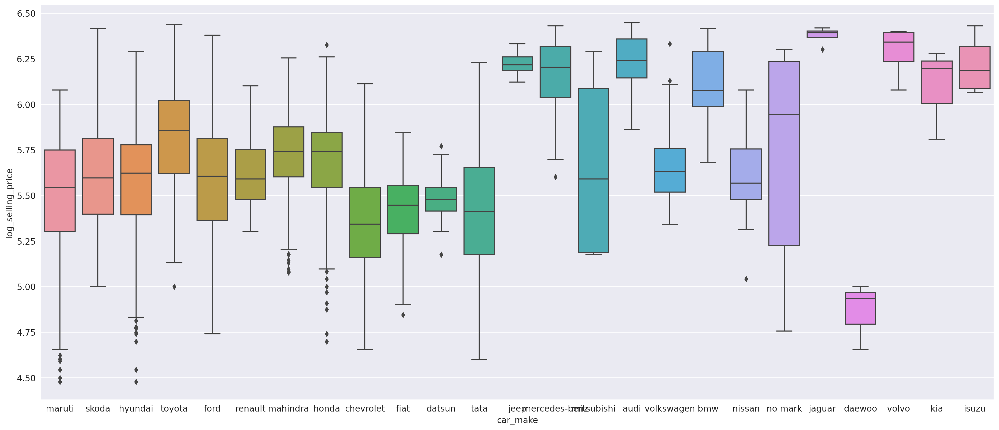

In [494]:
plt.figure(figsize=(24, 10))
plt.show(sns.boxplot(x="car_make", y=target_col, data=df_train_new))

Напрягает категория `jaguar`. С одной стороны там всего 4 записи, но с другой они все сконцентрированы рядом и служат индикатором того, что это luxury бренд, что в целом правда. Я не буду ничего дополнительно делать с этой категорией.
Остаётся удалить из тестовой выборки объекты бренды которых отсутствуют в трейне ("удалить" = объединить с `no mark`).

In [495]:
train_marks = set(df_train_new["car_make"].unique())
test_marks = set(df_test_new["car_make"].unique())

print("Бренды, которых нет в трейне:", *(test_marks - train_marks))

Бренды, которых нет в трейне: lexus opel


In [496]:
import pickle

with open("car_makes.pickle", "wb") as f:
  pickle.dump(train_marks, f)

In [497]:
df_test_new.loc[df_test_new["car_make"] == "opel", "car_make"] = "no mark"
df_test_new.loc[df_test_new["car_make"] == "lexus", "car_make"] = "no mark"
categorical_cols.append("car_make")

Теперь обучим модель с учётом нового признака.

In [505]:
from sklearn.base import BaseEstimator, TransformerMixin

class IdentityTransformer(BaseEstimator, TransformerMixin):
  def __init__(self):
    pass

  def fit(self, X, y=None):
    return self

  def transform(self, X, y=None):
    return X.copy()


In [499]:
identity = IdentityTransformer()
ohe = OneHotEncoder(drop="first", handle_unknown="ignore", sparse_output=False)
std = MinMaxScaler()
column_transformer = ColumnTransformer([
    ("identity", identity, binary_cols),
    ("ohe", ohe, categorical_cols),
    ("scaling", std, minmax_cols)
], remainder="drop", n_jobs=2)

X_train = column_transformer.fit_transform(df_train_new)
y_train = df_train_new[target_col].values
X_test = column_transformer.transform(df_test_new)
y_test = np.log10(df_test_new["selling_price"].values)

grid_search = GridSearchCV(Ridge(), {
    "alpha": np.logspace(-4, 5, 10),
    "max_iter": [100, 500, 1000, 2500, 5000],
    "tol": [1e-4, 1e-3, 1e-2, 1e-1]
}, cv=10, scoring=lambda c, x, y: r2_score(y, c.predict(x)), refit=False)

grid_search.fit(X_train, y_train)
best = grid_search.cv_results_["mean_test_score"].argmax()
best_params = grid_search.cv_results_["params"][best]
best_params

{'alpha': 0.01, 'max_iter': 100, 'tol': 0.0001}

In [513]:
import json
# json.dumps(df_train_new)
df_train_new.to_json()

'{"name":{"0":"Maruti Swift Dzire VDI","1":"Skoda Rapid 1.5 TDI Ambition","2":"Hyundai i20 Sportz Diesel","3":"Maruti Swift VXI BSIII","4":"Hyundai Xcent 1.2 VTVT E Plus","5":"Maruti Wagon R LXI DUO BSIII","6":"Maruti 800 DX BSII","7":"Toyota Etios VXD","8":"Ford Figo Diesel Celebration Edition","9":"Renault Duster 110PS Diesel RxL","10":"Maruti Zen LX","11":"Maruti Swift Dzire VDi","12":"Maruti Swift 1.3 VXi","13":"Maruti Wagon R LXI Minor","14":"Mahindra KUV 100 mFALCON G80 K8 5str","15":"Hyundai i20 1.4 CRDi Asta","16":"Maruti Alto LX","17":"Hyundai i20 2015-2017 Asta 1.4 CRDi","18":"Mahindra Verito 1.5 D4 BSIII","19":"Honda WR-V i-DTEC VX","20":"Maruti Swift Dzire ZDI","21":"Maruti SX4 ZDI","22":"Maruti Baleno Delta 1.2","23":"Maruti Alto 800 LXI","24":"Chevrolet Enjoy TCDi LTZ 7 Seater","25":"Maruti Wagon R LXI Minor","26":"Maruti Omni E MPI STD BS IV","27":"Maruti Vitara Brezza LDi Option","28":"Fiat Palio 1.2 ELX","29":"Maruti Omni 8 Seater BSIV","30":"Maruti Vitara Brezza LDi",

In [526]:
linreg = Ridge(**best_params).fit(X_train, y_train)
evaluate_log_clear(linreg, X_train, y_train, X_test, y_test)

log price predictions
Train data metrics:
R2 score: 0.8848222111143121
MSE: 0.011575127224231709
---------------------------------
Test data metrics:
R2 score: 0.907258012968639
MSE: 0.012512312744054226



price predictions
Train data metrics:
R2 score: 0.8694136042303321
MSE: 16783163656.267645
---------------------------------
Test data metrics:
R2 score: 0.7863893812564825
MSE: 122789483441.37059


$R^2$ до текущего задания: $0.63$  
$R^2$ после чистки выборки: $0.67$  
$R^2$ после добавления бренда: $0.78$

In [504]:
final_dict.update({"column_transformer": column_transformer,
                   "model": linreg})

with open("model.pickle", "wb") as f:
  pickle.dump(final_dict, f)

## Добавляем взаимодействия признаков

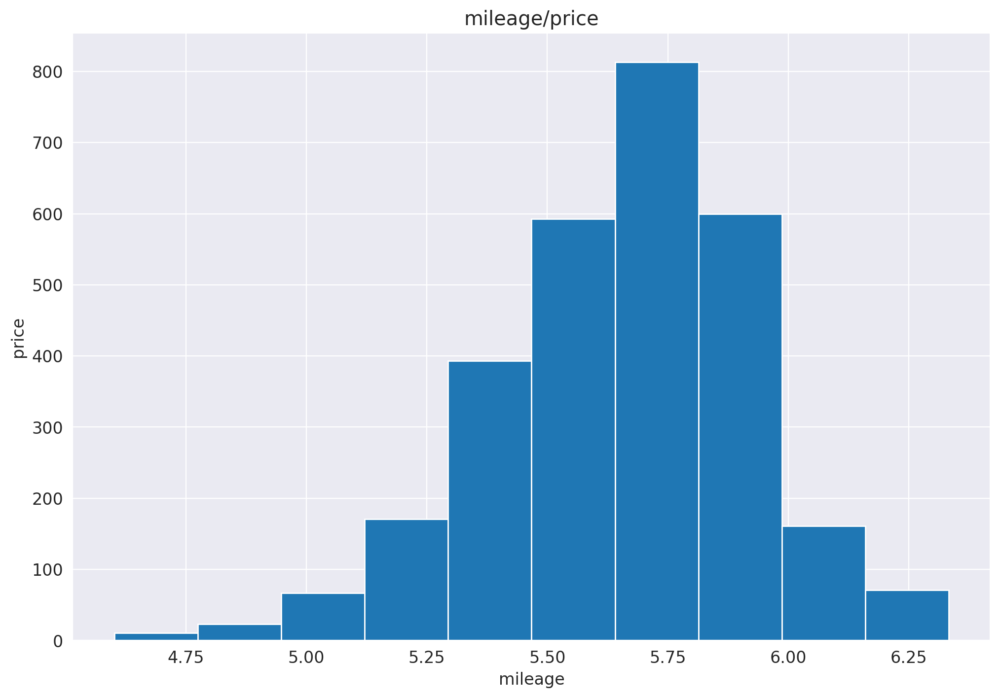

In [ ]:
fuel = df_train_new["fuel"]
transmission = df_train_new["transmission"]

diesel_man = df_train_new[(fuel == "Diesel") & (transmission == "Manual")]

plt.hist(diesel_man[target_col])
plt.title("mileage/price")
plt.xlabel("mileage")
plt.ylabel("price")
plt.show()

# Часть Бизнесовая (0.5 балла)

Заказчик просил вас посчитать кастомную метрику -- среди всех предсказанных цен на авто посчитать долю предиктов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

<font color='#9933CC'>Сделайте это самостоятельно для лучшей из своих моделей</font>

In [528]:
def business_metrics(y_true, y_pred):
    return (np.abs(y_true - y_pred) <= 0.1 * y_true).mean()

In [530]:
y_pred = linreg.predict(X_test)
bm = business_metrics(10 ** y_test, 10 ** y_pred)
print("Значение бизнес метрики для моей лучшей модели:", bm)

Значение бизнес метрики для моей лучшей модели: 0.348


# Часть 5 (2.5 балла) | Реализация сервиса на FastAPI

Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

In [ ]:
from fastapi import FastAPI
from pydantic import BaseModel
from typing import List

app = FastAPI()


class Item(BaseModel):
    name: str
    year: int
    selling_price: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str
    engine: str
    max_power: str
    torque: str
    seats: float


class Items(BaseModel):
    objects: List[Item]


@app.post("/predict_item")
def predict_item(item: Item) -> float:
    return ...


@app.post("/predict_items")
def predict_items(items: List[Item]) -> List[float]:
    return ...

Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# Часть 6 (1 балл) | Оформление результатов

**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете прислать screencast в ТГ
3. Просматривает ноутбук с pure-DS частью
4. Заглядывает в код сервиса
5. Хвалит

# Часть Благодарственная

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой.

https://drive.google.com/file/d/1LT06nyg9QgVi3r-D5BY-_mQ9TcJQFxJN/view?usp=share_link